# ERC-4626: best performing stablecoin vaults

- In this notebook, we find the best ERC-4626 vaults by their performance across multiple blockchains
    - We analyse the vault performance by its share price, as reported by ERC-4626 smart contract interface.    
    - We separate lending vaults (risk free) and volatile vaults (with drawdown)
    - We do last three months and historical all-time analyses
    - We look [quantitative finance](https://tradingstrategy.ai/glossary/quantitative-finance) aspects of the vaults like [returns](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr), [Sharpe](https://tradingstrategy.ai/glossary/sharpe) and [Sortino](https://tradingstrategy.ai/glossary/sortino) numbers    

Some notes
- Because of how vault metrics, share price and such are collected and interpreted, the results in this notebook contain various inaccuracies.
- In this notebook, we use terms Net Asset Value (NAV) and [Total Value Locked (TVL)](https://tradingstrategy.ai/glossary/total-value-locked-tvl) interchangeably.

## Usage

This is an open source notebook based on open data
- You can edit and remix this notebook yourself 

To do your own data research:

- Read general instructions [how to run the tutorials](./)
- See `ERC-4626 scanning all vaults onchain` example in tutorials first how to build a vault database as local `vault_db.pickle` file.
- See `ERC-4626: scanning vaults' historical price and performance` example in tutorials first how to build `vault-prices.parquet` file.

For any questions, follow and contact [Trading Strategy community](https://tradingstrategy.ai/community).

## Vault notes

For the context of the different vaults later in this notebook.

- [About gTRADE (formerly Gains Network)](https://gains.trade/vaults/gDAI): Market making vaults for gTRADE. Deposit DAI/USDC in exchange for gDAI, an ERC-20 representing your ownership in the vault. Stakers receive fees from each trade placed on the platform in exchange for serving as the counterparty to all trades. gDAI accumulates these fees in real-time.

- [About Ostium Vault (ostiumLP)](https://ostium.app/vault): Ostium is a real-world asset perp protocol. Earn fractional trading and liquidation fees with $OLP by providing liquidity with staked USDC. This pool acts as the ultimate backstop for trade settlement.

- [About 40acres](https://www.40acres.finance/): 40acres finance is NFT lending protocol (use NFTs as collateral). The vault named "Vault" on Base is by 40acres, they just forget the name their vault in idenfiable manner.

- [About Revert Lend](https://revert.finance/#/lending): Revert Lend borrows to Uniswap v3 market makers. Earn a variable interest by lending USDC to AMM LPs.  It allows users to collateralize their Uniswap v3 liquidity provider positions, in the form of the Uniswap NFTManager NFTs, and obtain loans in a protocol-determined ERC-20 token. The protocol is specifically designed to allow Liquidity Providers to maintain control over the capital in their positions while they are collateralized. This feature facilitates uninterrupted management and optimization of LP positions, catering to the dynamic needs of liquidity providers.

- [About Peapods](https://peapods.finance/app): Peapods pioneered the concept of Volatility Farming; The ability to bring together two uncorrelated assets into an LP position to farm the volatility between the assets and tokenize it as yield. protocols, or earning fees from wrapping/unwrapping.

- [About D2.finance and HYPE++](https://gitbook.d2.finance/): D2 Finance is provides Tokenized DeFi Derivatives Strategies delivering superior risk-adjusted returns, with full on-chain transparency. HYPE++ vault is an Arbitrum vault that trades on Hyperliquid through briding. HYPE++ will take advantage of the current funding rate arbitrage to provide boosted risk-adjusted returns. The hedging mechanism using so called “Ghost VC tokens” provides a risk management layer. HYPE++ identifies and shorts tokens which are overvalued in the market creating an inverse position which can offset potential market downturns, effectively reducing strategy market beta risk. 

- [About dgnHYPE](https://www.dsquaredcap.com/): A proprietary trading strategy "DSquared Investment Vault V0 " by D Squared Capital. 
DSQ is a global investment firm employing a differentiated investment strategy to some of the world’s most exciting companies. We act as a transformative capital source to businesses, providing founders and companies solutions that offer value creation across ever changing markets.


## Setup

- Set up notebook rendering output mode
- Use static image charts so this notebook is readeable on Github / ReadTheDocs

In [63]:
import pandas as pd
from plotly.offline import init_notebook_mode
import plotly.io as pio

from eth_defi.vault.base import VaultSpec

pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_columns = None
pd.options.display.max_rows = None


# Set up Plotly chart output as SVG
image_format = "png"
width = 1400
height = 800

 # https://stackoverflow.com/a/52956402/315168
init_notebook_mode()

# https://stackoverflow.com/a/74609837/315168
assert hasattr(pio, "kaleido"), "Kaleido rendering backend missing. Run 'pip install kaleido' needed for this notebook"
pio.kaleido.scope.default_format = image_format

# https://plotly.com/python/renderers/#overriding-the-default-renderer
pio.renderers.default = image_format

current_renderer = pio.renderers[image_format]
# Have SVGs default pixel with
current_renderer.width = width
current_renderer.height = height

try:
    # Optionally make charts easier to share on Twitter
    from tradeexecutor.utils.notebook import set_large_plotly_chart_font
    set_large_plotly_chart_font(line_width=5, legend_font_size=16)
    pio.templates.default = "custom"
except ImportError:
    print("Could not import set_large_plotly_chart_font() from tradeexecutor.utils.notebook and set large output font. ")
    pio.templates.default = "plotly_white"

Could not import set_large_plotly_chart_font() from tradeexecutor.utils.notebook and set large output font. 


## Read previously scanned vault price data

- Read the Parquet file produced earlier with price scan 

In [64]:
import pickle
from pathlib import Path

output_folder = Path("~/.tradingstrategy/vaults").expanduser()
parquet_file = output_folder / "vault-prices.parquet"
assert parquet_file.exists(), "Run the vault scanner script first"

vault_db = output_folder / "vault-db.pickle"
assert vault_db.exists(), "Run the vault scanner script first"
vault_db = pickle.load(open(vault_db, "rb"))

try:
    prices_df = pd.read_parquet(parquet_file)
except Exception as e:
    raise RuntimeError(f"Could not read: {parquet_file}: {e}") from e

chains = prices_df["chain"].unique()

print(f"We have {len(prices_df):,} price rows and {len(vault_db)} vault metadata entries for {len(chains)} chains")

sample_vault = next(iter(vault_db.values()))
print("We have vault metadata keys: ", ", ".join(c for c in sample_vault.keys()))
display(pd.Series(sample_vault))

print("We have prices DataFrame columns: ", ", ".join(c for c in prices_df.columns))
print("DataFrame sample:")
display(prices_df.head())

We have 1,960,583 price rows and 8984 vault metadata entries for 17 chains
We have vault metadata keys:  Symbol, Name, Address, Denomination, NAV, Protocol, Mgmt fee, Perf fee, Shares, First seen, _detection_data, _denomination_token, _share_token


Symbol                                             fBPT-50STABAL3-50WETH
Name                                           FARM_BPT-50STABAL3-50WETH
Address                       0xdfa7578b8187f5dd1d0cb9d86b6dd33625895cf2
Denomination                                        BPT-50STABAL3-50WETH
NAV                                                 0.042399649489411407
Protocol                                                 Harvest Finance
Mgmt fee                                                            None
Perf fee                                                            None
Shares                                              0.042300245583425379
First seen                                           2023-08-04 15:37:57
_detection_data        ERC4262VaultDetection(chain=8453, address='0xd...
_denomination_token    {'name': 'Balancer 50 STABAL3 50 WETH', 'symbo...
_share_token           {'name': 'FARM_BPT-50STABAL3-50WETH', 'symbol'...
dtype: object

We have prices DataFrame columns:  chain, address, block_number, timestamp, share_price, total_assets, total_supply, performance_fee, management_fee, errors
DataFrame sample:


,chain,address,block_number,timestamp,share_price,total_assets,total_supply,performance_fee,management_fee,errors
0,81457,0x8e2b50413a53f50e2a059142a9be060294961e40,213961,2024-02-29 20:15:37,1.00,0.00,0.00,NaN,NaN,
1,81457,0x8e2b50413a53f50e2a059142a9be060294961e40,257161,2024-03-01 20:15:37,1.00,"1,123.90","1,123.90",NaN,NaN,
2,81457,0x2ead9c6c7cab1dd3442714a8a8533078c402135a,257161,2024-03-01 20:15:37,1.00,3.52,3.52,NaN,NaN,
3,81457,0xb9d94a3490ba2482e2d4f21f0e76b92e5661ded8,257161,2024-03-01 20:15:37,1.00,0.10,0.10,NaN,NaN,
4,81457,0x620aa22aa45f59af91cafbad0ab58181fcdbfb08,257161,2024-03-01 20:15:37,1.00,"1,253.17","1,253.17",NaN,NaN,


## Transform data

- Combine columns from metadata database with price series for easier manipulation

In [65]:
from eth_defi.chain import get_chain_name


vaults_by_id = {
    f"{vault['_detection_data'].chain}-{vault['_detection_data'].address}": vault for vault in vault_db.values()
}

# We use name later as DF index, so we need to make sure they are unique
counter = 1
used_names = set()
for id, vault in vaults_by_id.items():

    # 40acres forgot to name their vault
    if vault["Name"] == "Vault":
        vault["Name"] == "40acres"

    if vault["Name"] in used_names:
        chain_name = get_chain_name(vault["_detection_data"].chain)
        vault["Name"] = f"{vault['Name']} ({chain_name}) #{counter}"
        counter += 1

    used_names.add(vault["Name"])

print(f"Fixed {counter} duplicate vault names")


# Vaults are identified by their chain and address tuple, make this one human-readable column 
# to make DataFrame wrangling easier
prices_df['id'] = prices_df['chain'].astype(str) + '-' + prices_df['address'].astype(str)
prices_df['name'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['Name'] if x in vaults_by_id else None)
prices_df['event_count'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['_detection_data'].deposit_count + vaults_by_id[x]['_detection_data'].redeem_count)
prices_df['protocol'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['Protocol'] if x in vaults_by_id else None)

# 40acres fix - they did not name their vault,
# More about this later
prices_df['name'] = prices_df['name'].fillna("<unknown>")


display(prices_df.head(1))

Fixed 3418 duplicate vault names


,chain,address,block_number,timestamp,share_price,total_assets,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol
0,81457,0x8e2b50413a53f50e2a059142a9be060294961e40,213961,2024-02-29 20:15:37,1.00,0.00,0.00,NaN,NaN,,81457-0x8e2b50413a53f50e2a059142a9be060294961e40,Wasabi WETH Vault (Blast) #2722,243212,<unknown ERC-4626>


## Filter down to USD-based vaults

- In this notebooks, we focus on stablecoin yield
- Do not consider WETH, other native token vaults, as their returns calculation 
  would need to match the appreciation of underlying assets
- [is_stablecoin_like](https://web3-ethereum-defi.readthedocs.io/api/core/_autosummary/eth_defi.token.is_stablecoin_like.html?highlight=is_stablecoin_like#eth_defi.token.is_stablecoin_like) supports GHO, crvUSD and other DeFi/algorithmic stablecoins
- Note that this picks up very few EUR and other fiat-nominated vaults


In [66]:
from eth_defi.token import is_stablecoin_like

usd_vaults = [v for v in vault_db.values() if is_stablecoin_like(v["Denomination"])]
print(f"We have {len(usd_vaults)} stablecoin-nominated vaults out of {len(vault_db)} total vaults")

# Build chain-address strings for vaults we are interested in
allowed_vault_ids = set(str(v["_detection_data"].chain) + "-" + v["_detection_data"].address for v in usd_vaults)

# Filter out prices to contain only data for vaults we are interested in
prices_df = prices_df.loc[prices_df["id"].isin(allowed_vault_ids)]
print(f"Filtered out prices have {len(prices_df):,} rows")

We have 3078 stablecoin-nominated vaults out of 8984 total vaults
Filtered out prices have 706,258 rows


## Calculate return series for all vaults

- Build daily returns for all vaults we have some good data

In [67]:

def calculate_daily_returns(df_work):
    """Calculate daily returns for each vault in isolation"""

    # Group by chain and address, then resample and forward fill

    df_work = df_work.set_index("timestamp")

    result_dfs = []
    for (chain_val, addr_val), group in df_work.groupby(['chain', 'address']):
        # Resample this group to daily frequency and forward fill
        resampled = group.resample('D').ffill()
        
        # Calculate daily returns
        resampled['daily_returns'] = resampled['share_price'].pct_change(fill_method=None).fillna(0)
        
        # Add back the groupby keys as they'll be dropped during resampling
        resampled['chain'] = chain_val
        resampled['address'] = addr_val
        
        result_dfs.append(resampled)

    # Concatenate all the processed groups
    df_result = pd.concat(result_dfs)
    
    return df_result

raw_returns_df = returns_df = calculate_daily_returns(prices_df)

print("All returns DataFrame sample data:")
display(returns_df.head())


All returns DataFrame sample data:


,chain,address,block_number,share_price,total_assets,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol,daily_returns
timestamp,,,,,,,,,,,,,,
2024-01-11,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2024-01-12,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,985,099.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1530,"1,783.00",<unknown ERC-4626>,0.00
2024-01-13,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,992,299.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1530,"1,783.00",<unknown ERC-4626>,0.00
2024-01-14,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,999,499.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1530,"1,783.00",<unknown ERC-4626>,0.00
2024-01-15,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"19,006,699.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1530,"1,783.00",<unknown ERC-4626>,0.00


## Clean and filter returns

- In returns data we have outliers that are likely not real returns, or one-time events that cannot repeat. 
    - Floating point errors: [Share price may jumps wildly when a vault TVL is near zero](https://x.com/0xSEM/status/1914748782102630455)
    - Bugs: Vault share price method to estimate returns does not work for a particular airdrop
    - Airdrops: Vault gets an irregular rewards that will not repeat, and thus are not good to estimate the 
      future performance
- We clean returns by doing an assumptions
  - Daily returns higher than static outlier
  - Daily TVL max does not make sense
  - Daily TVL min does not make sense
  - Daily TVL % below lifetime average TVL

In [68]:
# Set threshold we suspect not valid returns for one day
outlier_threshold = 0.50


returns_df = raw_returns_df

high_returns_mask = returns_df['daily_returns'] > outlier_threshold
outlier_returns = returns_df[high_returns_mask]

# Sort by return value (highest first)
outlier_returns = outlier_returns.sort_values(by='daily_returns', ascending=False)

# Display the results
print(f"Found {len(outlier_returns)} outlier returns > {outlier_threshold:%}")
display(outlier_returns[['name', 'id', 'daily_returns', 'share_price', 'total_assets']].head(3))

# Show the distribution of these outliers by vault
outlier_counts = outlier_returns.groupby('name').size().sort_values(ascending=False)
print("\nOutlier distribution by vault:")
display(outlier_counts.head(3))

# Clean up obv too high returns
returns_df.loc[returns_df['daily_returns'] > outlier_threshold, 'daily_returns'] = 0



Found 497 outlier returns > 50.000000%


,name,id,daily_returns,share_price,total_assets
timestamp,,,,,
2024-03-21,Delta Netural GMX Vault (Senior),42161-0xf18ac7de839d45d0f004a95438c3bce8e27710c2,"122,731,838,302,280,347,717,441,024,244,545,825...","135,647,172,872,128,225,692,532,841,165,396,824...","115,792,089,237,316,190,183,760,311,394,656,140..."
2024-03-21,Delta Netural GMX Vault (Senior) (Arbitrum) #423,42161-0xc57adf9f249e687d180d3a24adac636fe881d5c8,"40,283,734,187,577,148,557,017,091,836,548,671,...","43,798,939,765,276,188,514,203,304,177,838,675,...","115,792,089,237,316,190,183,760,311,394,656,140..."
2023-01-16,Delta Netural GMX Vault (Senior) (Arbitrum) #373,42161-0xf5f77bd63daab15568ace0eb4b5b16d8bb69d534,"30,828,589,383,142,789,278,379,789,739,541,769,...","30,985,969,524,987,473,576,135,629,253,887,830,...","115,792,089,237,316,190,183,760,311,394,656,140..."



Outlier distribution by vault:


name
FJ_20230712_xxxxxx                                                   34
Revert Lend Arbitrum USDC,                                           29
Yielder Quickswap V3 WETH/USDC dynamically hedged (Polygon) #2333    24
dtype: int64

### TVL-based threshold filtering of returns

In [69]:
# Static threshold for TVL
import warnings


tvl_threshold_min = 1000.00
tvl_threshold_max = 99_000_000_000 # USD 99B
tvl_threshold_min_dynamic = 0.02


# TVL based cleaning.
# Create a mask based on TVL conditions.
# Clean up returns during low TVL periods
# pd.Timestamp("2024-02-10")
mask = (returns_df['total_assets'] < tvl_threshold_min)
mask |= (returns_df['total_assets'] > tvl_threshold_max)

# Clean up by dynamic TVL threshold filtering
# 
# Morpho Steakhouse USDT Compounder by Yearn case, and similars
# https://x.com/moo9000/status/1914746350216077544

# Calculate all-time average of total_assets for each vault
avg_assets_by_vault = returns_df.groupby('id')['total_assets'].mean()
returns_df['avg_assets_by_vault'] = returns_df['id'].map(avg_assets_by_vault)
returns_df['dynamic_tvl_threshold'] = returns_df['id'].map(avg_assets_by_vault) * tvl_threshold_min_dynamic

# Create a mask for rows where total_assets is below the threshold
below_threshold_mask = returns_df['total_assets'] < returns_df['dynamic_tvl_threshold']
mask |= below_threshold_mask
# Count how many data points will be affected
affected_count = below_threshold_mask.sum()
print(f"Setting daily_returns to zero for {affected_count:,} / {len(returns_df):,} data points where total_assets < {tvl_threshold_min_dynamic:.2%} of all-time average TVL")

# We also need to expand the mask, 
# so that we zero the returns of the following day
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    mask = mask | mask.groupby(returns_df['id']).shift(1).fillna(False)

# Set daily_returns to zero where the mask is True
returns_df.loc[mask, 'daily_returns'] = 0
returns_df['tvl_filtering_mask'] = mask

Setting daily_returns to zero for 142,345 / 661,497 data points where total_assets < 2.00% of all-time average TVL


## Calculate lifetime, annual and 3M returns for each vault

- Calculate compounding annual return ([CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr) )and lifetime returns for all price series
- We also calculate returns for the last three months, reflecting the recent performance
- You can benchmark numbers on protocol-maintained frontends, example: [Yearn: DAI to yvUSDS Farmer](https://yearn.fi/vaults/1/0x6acEDA98725505737c0F00a3dA0d047304052948?tab=about)
- CAGR, returns, etc. are expressed in raw values: 0.01 means 1% return
- Calculate volatility so we can separate actively trading vaults (market making, such) from passive vaults (lending optimisaiton)

To clean the data, we filter out based on 
- Too high NAV value (broken tokens?)
- Too min NAV value (test vaults)
- Not enough deposit and redemption activity

**Note**: These are gross returns. Due to lack of standardisation on vault fee structure, maintaining fee data is mostly manual job.

In [70]:
import warnings
import numpy as np

from eth_defi.chain import get_chain_name

three_months_ago = pd.Timestamp.now() - pd.DateOffset(months=3)

def calculate_lifetime_metrics(df):
    results = []
    
    for id_val, group in df.groupby('id'):
        # Sort by timestamp just to be safe
        group = group.sort_index()
        name = vaults_by_id[id_val]['Name'] if id_val in vaults_by_id else None
        
        # Calculate lifetime return using cumulative product approach
        lifetime_return = (1 + group['daily_returns']).prod() - 1

        last_three_months = group['daily_returns'].loc[three_months_ago:]
        three_month_returns = (1 + last_three_months).prod() - 1

        # Calculate volatility so we can separate actively trading vaults (market making, such) from passive vaults (lending optimisaiton)
        three_months_volatility = last_three_months.std()

        max_nav = group['total_assets'].max()
        current_nav = group['total_assets'].iloc[-1]
        chain_id = group['chain'].iloc[-1]
        mgmt_fee = group['management_fee'].iloc[-1]
        perf_fee = group['performance_fee'].iloc[-1]
        event_count = group['event_count'].iloc[-1]
        protocol = group['protocol'].iloc[-1]
        
        # Calculate CAGR
        # Get the first and last date
        start_date = group.index.min()
        end_date = group.index.max()
        years = (end_date - start_date).days / 365.25        
        cagr = (1 + lifetime_return) ** (1 / years) - 1 if years > 0 else np.nan

        # Calculate 3 months CAGR
        # Get the first and last date
        start_date = last_three_months.index.min()
        end_date = last_three_months.index.max()
        three_months_cagr = (1 + three_month_returns) ** (1 / years) - 1 if years > 0 else np.nan

        results.append({            
            'name': name,
            'cagr': cagr,
            'lifetime_return': lifetime_return,            
            'three_months_cagr': three_months_cagr,
            "three_months_volatility": three_months_volatility,
            'denomination': vaults_by_id[id_val]['Denomination'] if id_val in vaults_by_id else None,
            'chain': get_chain_name(chain_id),            
            'peak_nav': max_nav,            
            'current_nav': current_nav,
            'years': years, 
            "mgmt_fee": mgmt_fee,
            "perf_fee": perf_fee,
            "event_count": event_count,
            "protocol": protocol,
            'id': id_val,
            'three_months_returns': three_month_returns,            
            'start_date': start_date,
            'end_date': end_date,

        })
    
    return pd.DataFrame(results)


# Numpy complains about something
# - invalid value encountered in reduce
# - Boolean Series key will be reindexed to match DataFrame index. 
with warnings.catch_warnings():
    warnings.simplefilter("ignore", UserWarning)
    warnings.simplefilter("ignore", RuntimeWarning)
    lifetime_data_df = calculate_lifetime_metrics(returns_df)

lifetime_data_df = lifetime_data_df.sort_values(by='cagr', ascending=False)
lifetime_data_df = lifetime_data_df.set_index('name') 

assert not lifetime_data_df.index.duplicated().any(), f"There are duplicate ids in the index: {lifetime_data_df.index}"

# Verify we no longer have duplicates
# display(lifetime_data_df.index)
assert not lifetime_data_df.index.dropna().duplicated().any(), f"There are still duplicate names in the index: {lifetime_data_df.index}"
print("Successfully made all vault names unique by appending chain information")

print(f"Calculated lifetime data for {len(lifetime_data_df):,} vaults")
print("Sample entrys of lifetime data:")
display(lifetime_data_df.tail(1))

#
# Clean data
#

# Filter FRAX vault with broken interface
lifetime_data_df = lifetime_data_df[~lifetime_data_df.index.isna()]

# Filter out MAAT Stargate V2 USDT	
# Not sure what's going on with this one and other ones with massive returns.
# Rebase token?
# Consider 10,000x returns as "valid"
lifetime_data_df = lifetime_data_df[lifetime_data_df["cagr"] < 10_000]

# Filter out some vaults that report broken NAV
broken_max_nav_value = 99_000_000_000
broken_mask = lifetime_data_df['peak_nav'] > broken_max_nav_value
print(f"Vault entries with too high NAV values filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]

# Filter out some vaults that have too little NAV (ATH NAV)
lifetime_min_nav_threshold = 100.00
broken_mask = lifetime_data_df['peak_nav'] <= lifetime_min_nav_threshold
print(f"Vault entries with too small ATH NAV values filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]

# Filter out some vaults that have not seen many deposit and redemptions 
min_events = 25
broken_mask = lifetime_data_df['event_count'] < min_events
print(f"Vault entries with too few deposit and redeem events (min {min_events}) filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]


Successfully made all vault names unique by appending chain information
Calculated lifetime data for 1,786 vaults
Sample entrys of lifetime data:


,cagr,lifetime_return,three_months_cagr,three_months_volatility,denomination,chain,peak_nav,current_nav,years,mgmt_fee,perf_fee,event_count,protocol,id,three_months_returns,start_date,end_date
name,,,,,,,,,,,,,,,,,
EVK Vault eUSDC-7 (Avalanche) #3318,NaN,0.00,NaN,NaN,USDC,Avalanche,2.00,2.00,0.00,NaN,NaN,7.00,Euler Vault Kit,43114-0xa6f3fbc837d38b741abe2374d4b6da1ab38f3397,0.00,2025-05-16,2025-05-16


Vault entries with too high NAV values filtered out: 5
Vault entries with too small ATH NAV values filtered out: 265
Vault entries with too few deposit and redeem events (min 25) filtered out: 402


## Top 50 vault lists

### Historical performance, including dead ones

- Sorted by lifetime returns, the current three month returns displayed as well
- Vaults may be dead today with zero NAV/TVL
- Reasons why NAV drops to zero may include: hacks, rug pulls, etc.
- Share price calculation for low TVL vaults may have various inaccuracies because vaults implement vesting/locking mechanisms which are not visible in the share price

In [71]:
def format_lifetime_table(df: pd.DataFrame) -> pd.DataFrame:
    """Format table for human readable output"""

    df = df.copy()
    df["cagr"] = df["cagr"].apply(lambda x: f"{x:.2%}")
    df["lifetime_return"] = df["lifetime_return"].apply(lambda x: f"{x:.2%}")
    df["three_months_cagr"] = df["three_months_cagr"].apply(lambda x: f"{x:.2%}")
    df["three_months_returns"] = df["three_months_returns"].apply(lambda x: f"{x:.2%}")
    df["three_months_volatility"] = df["three_months_volatility"].apply(lambda x: f"{x:.4f}")
    df["event_count"] = df["event_count"].apply(lambda x: f"{x:,}")
    df["mgmt_fee"] = df["mgmt_fee"].apply(lambda x: f"{x:.2%}" if pd.notna(x) else 'unknown')
    df["perf_fee"] = df["perf_fee"].apply(lambda x: f"{x:.2%}" if pd.notna(x) else 'unknown')
    
    df = df.rename(columns={
        "cagr": "Annualised return",
        "lifetime_return": "Lifetime return",
        "three_months_cagr": "Last 3M return",
        "three_months_volatility": "Last 3M months volatility",
        "three_months_returns": "Last 3M return",
        "event_count": "Deposit/redeem count",
        "peak_nav": "Peak TVL USD",
        "current_nav": "Current TVL USD",
        "years": "Age (years)",
        "mgmt_fee": "Management fee",
        "perft_fee": "Performance fee",
        "denomination": "Deposit token",
        "chain": "Chain",
        "protocol": "Protocol",
        "start_date": "First deposit",
        "end_date": "Last deposit",
        
    })
    return df


nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['peak_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='cagr', ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 736 out of 835 total vaults
Vaults with negative returns 99 out of 835 total vaults


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 17,38186.66%,385.27%,37890.41%,0.0277,USDC,Base,"60,690.86","4,966.31",0.27,unknown,unknown,191.0,Peapods,8453-0xeee75954eded526ef98a0cecc027beee4586315e,384.27%,2025-02-17,2025-05-15
FS_20230712_xxxxxx,1316.35%,11582.53%,229.51%,0.0742,EURe,Ethereum,"1,145,503.04",0.00,1.80,unknown,unknown,494.0,<unknown ERC-4626>,1-0xc067dce92f48f967da11f03c7f2f06cc9ceab1eb,751.36%,2025-02-17,2025-05-15
None (Ethereum) #3284,947.86%,26.06%,947.86%,0.0230,USDC,Ethereum,"815,942.52","815,942.52",0.10,unknown,unknown,57.0,<unknown ERC-4626>,1-0x4f95c5ba0c7c69fb2f9340e190ccee890b3bd87c,26.06%,2025-04-09,2025-05-15
Seamless ILM 1.5x Loop USDC/ETH,317.12%,189.67%,134.58%,0.0584,USDC,Base,"95,589.65","3,411.32",0.74,unknown,unknown,"1,510.0",<unknown ERC-4626>,8453-0x68dfad1a72c63897fec5fb9de9fdb5670280291e,88.69%,2025-02-17,2025-05-15
MaxEarn USDC,140.12%,38.23%,109.57%,0.0050,USDC,Ethereum,"57,756.52","2,072.69",0.37,0.00%,10.00%,97.0,Morpho,1-0x51056b3f809f4cfe17e1a8715b82f5dbbca5a5a1,31.45%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 16,101.35%,17.46%,101.35%,0.0040,USDC,Ethereum,"51,153.21","15,890.00",0.23,unknown,unknown,95.0,Peapods,1-0xca1154bbd62c21868a358f9f782b90d69af600b0,17.46%,2025-02-20,2025-05-15
dgnBTC v2,96.99%,43.61%,-3.28%,0.0019,USDC,Base,"100,871.97","1,375.31",0.53,unknown,unknown,43.0,<unknown ERC-4626>,8453-0x6c05a7d2c24b48fc3c615d294fec2eb068548897,-1.76%,2025-02-17,2025-05-15
ETH++ (Arbitrum) #753,79.09%,124.90%,0.00%,0.0000,USDC,Arbitrum,"802,322.45","2,520.64",1.39,unknown,unknown,131.0,<unknown ERC-4626>,42161-0x27d22eb71f00495eccc89bb02c2b68e6988c6a42,0.00%,2025-02-17,2025-05-15
OkToken,66.66%,65.21%,0.00%,0.0000,USDT,Ethereum,"214,288.94",976.40,0.98,unknown,unknown,116.0,<unknown ERC-4626>,1-0x1d10bd08a745758e601cc9a98f04d4afce3bdd22,0.00%,2025-02-17,2025-05-15


### Historical performance, vaults still alive

- Sorted by lifetime returns
- Vaults have still meaningful TVL today


In [72]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['current_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='cagr', ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 459 out of 511 total vaults
Vaults with negative returns 52 out of 511 total vaults


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
None (Ethereum) #3284,947.86%,26.06%,947.86%,0.0230,USDC,Ethereum,"815,942.52","815,942.52",0.10,unknown,unknown,57.0,<unknown ERC-4626>,1-0x4f95c5ba0c7c69fb2f9340e190ccee890b3bd87c,26.06%,2025-04-09,2025-05-15
Gains Network USDC (Polygon) #2422,57.44%,82.24%,-0.25%,0.0253,USDC,Polygon,"1,040,536.58","886,109.07",1.32,unknown,unknown,703.0,<unknown ERC-4626>,137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81,-0.33%,2025-02-17,2025-05-16
cSuperior Quality Private Credit USDC,56.75%,29.49%,42.43%,0.0016,USDC,Ethereum,"251,714.97","237,669.81",0.57,unknown,unknown,72.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,22.55%,2025-02-17,2025-05-15
USDS Compound V3 Lender,56.19%,20.10%,25.23%,0.0032,USDS,Ethereum,"1,921,612.44","468,564.78",0.41,unknown,unknown,104.0,<unknown ERC-4626>,1-0x6701dea9809deaf068b8445798d0e19b025480fe,9.68%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 24 (Ethereum) #3287,49.76%,1.45%,49.76%,0.0007,USDC,Ethereum,"1,607,708.23","1,607,708.23",0.04,unknown,unknown,155.0,Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,1.45%,2025-05-02,2025-05-15
HYPE++,46.47%,20.07%,21.93%,0.0059,USDC,Arbitrum,"2,500,000.00","2,500,000.00",0.48,unknown,unknown,124.0,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,9.97%,2025-02-17,2025-05-15
kBOX,41.37%,12.26%,42.02%,0.0051,VUSD,Binance,"6,119,183.47","5,568,010.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,12.43%,2025-02-17,2025-05-16
Vault (Base) #174,37.29%,9.54%,27.38%,0.0004,USDC,Base,"1,860,740.81","1,569,804.49",0.29,unknown,unknown,"1,242.0",<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,7.21%,2025-02-17,2025-05-15
POPT-V1.1 USDC LP on ETH/USDC 5bps (Base) #3227,37.02%,1.39%,37.02%,0.0009,USDC,Base,"46,052.05","46,052.05",0.04,unknown,unknown,85.0,Panoptic,8453-0xabbad7a755bdf9bbec357e2bdf4c02934a8d7a71,1.39%,2025-04-29,2025-05-15


### Last three months returns, including low-activity ones

- Sorted by three months CAGR
- Include low-activity ones

In [73]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['current_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 459 out of 511 total vaults
Vaults with negative returns 52 out of 511 total vaults


,Last 3M return,Annualised return,Lifetime return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
None (Ethereum) #3284,947.86%,947.86%,26.06%,0.0230,USDC,Ethereum,"815,942.52","815,942.52",0.10,unknown,unknown,57.0,<unknown ERC-4626>,1-0x4f95c5ba0c7c69fb2f9340e190ccee890b3bd87c,26.06%,2025-04-09,2025-05-15
Peapods Interest Bearing USDC - 24 (Ethereum) #3287,49.76%,49.76%,1.45%,0.0007,USDC,Ethereum,"1,607,708.23","1,607,708.23",0.04,unknown,unknown,155.0,Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,1.45%,2025-05-02,2025-05-15
cSuperior Quality Private Credit USDC,42.43%,56.75%,29.49%,0.0016,USDC,Ethereum,"251,714.97","237,669.81",0.57,unknown,unknown,72.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,22.55%,2025-02-17,2025-05-15
kBOX,42.02%,41.37%,12.26%,0.0051,VUSD,Binance,"6,119,183.47","5,568,010.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,12.43%,2025-02-17,2025-05-16
POPT-V1.1 USDC LP on ETH/USDC 5bps (Base) #3227,37.02%,37.02%,1.39%,0.0009,USDC,Base,"46,052.05","46,052.05",0.04,unknown,unknown,85.0,Panoptic,8453-0xabbad7a755bdf9bbec357e2bdf4c02934a8d7a71,1.39%,2025-04-29,2025-05-15
40op-USDC-Vault,27.95%,27.95%,5.55%,0.0005,USDC,Optimism,"529,372.61","445,848.81",0.22,unknown,unknown,345.0,<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,5.55%,2025-02-24,2025-05-15
Vault (Base) #174,27.38%,37.29%,9.54%,0.0004,USDC,Base,"1,860,740.81","1,569,804.49",0.29,unknown,unknown,"1,242.0",<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,7.21%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 42,26.70%,28.46%,6.37%,0.0003,USDC,Base,"93,761.20","28,852.59",0.25,unknown,unknown,"1,954.0",Peapods,8453-0x4b5c90dc6bc08a10a24487726e614e9d148362e1,6.00%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 21,25.86%,25.86%,3.52%,0.0004,USDC,Ethereum,"83,846.99","67,756.54",0.15,unknown,unknown,553.0,Peapods,1-0xf419c7674536f6b32b9a73929dbf4ff5c2386d5c,3.52%,2025-03-21,2025-05-15


### Last three months return, popular vaults

<a id="top-3M"></a>

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only vaults with significant number of deposit events over life time, or "popular vaults"


In [74]:
nav_threshold = 100_000
event_threshold = 450

lifetime_data_filtered_df = lifetime_data_df[
    (lifetime_data_df['current_nav'] >= nav_threshold) &
    (lifetime_data_df['event_count'] >= event_threshold)
]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $100,000 USD
Vaults with positive returns 240 out of 258 total vaults
Vaults with negative returns 18 out of 258 total vaults


,Last 3M return,Annualised return,Lifetime return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
Vault (Base) #174,27.38%,37.29%,9.54%,0.0004,USDC,Base,"1,860,740.81","1,569,804.49",0.29,unknown,unknown,"1,242.0",<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,7.21%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 6,19.97%,21.09%,5.10%,0.0005,USDC,Arbitrum,"2,619,178.82","2,619,178.82",0.26,unknown,unknown,"1,973.0",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,4.85%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 67,19.50%,19.50%,2.47%,0.0002,USDC,Base,"168,233.52","137,595.08",0.14,unknown,unknown,"1,936.0",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2.47%,2025-03-26,2025-05-15
Peapods Interest Bearing USDC.e - 11,18.22%,18.22%,2.36%,0.0003,USDC.e,Sonic,"648,118.49","138,165.70",0.14,unknown,unknown,"5,464.0",Peapods,146-0x4c318e6a973f78e3aa36e8661a9770c427eacf97,2.36%,2025-03-26,2025-05-16
Gains Network USDC,13.84%,-96.41%,-88.12%,0.0165,USDC,Base,"4,936,901.59","3,208,368.80",0.64,unknown,unknown,"1,520.0",<unknown ERC-4626>,8453-0xad20523a7dc37babc1cc74897e4977232b3d02e5,8.66%,2025-02-17,2025-05-15
maxAPY USD Share (Base) #3129,13.63%,13.63%,0.95%,0.0004,USDC,Base,"323,606.28","276,501.33",0.07,unknown,unknown,551.0,Superform,8453-0x7a63e8fc1d0a5e9be52f05817e8c49d9e2d6efae,0.95%,2025-04-18,2025-05-15
Staked Falcon USD,13.23%,13.23%,3.11%,0.0002,USDf,Ethereum,"224,272,760.46","218,725,211.94",0.25,unknown,unknown,"4,406.0",<unknown ERC-4626>,1-0xc8cf6d7991f15525488b2a83df53468d682ba4b0,3.11%,2025-02-17,2025-05-15
"Silo Finance Borrowable USDC.e Deposit, SiloId: 27",9.86%,11.79%,3.10%,0.0001,USDC.e,Sonic,"1,998,193.19","1,900,463.81",0.27,unknown,unknown,"3,997.0",<unknown ERC-4626>,146-0x7e88ae5e50474a48dea4c42a634aa7485e7caa62,2.61%,2025-02-17,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 49",9.00%,9.00%,1.04%,0.0001,USDC.e,Sonic,"1,305,078.29","873,130.50",0.12,unknown,unknown,"2,194.0",<unknown ERC-4626>,146-0xa18a8f100f2c976044f2f84fae1ee9f807ae7893,1.04%,2025-04-02,2025-05-16


### Last three months return, large vaults with min TVL $5M

<a id="top-3M"></a>

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only large vaults with minimum of $5M current TVL


In [75]:
nav_threshold = 5_000_000
event_threshold = 10

lifetime_data_filtered_df = lifetime_data_df[
    (lifetime_data_df['current_nav'] >= nav_threshold) &
    (lifetime_data_df['event_count'] >= event_threshold)
]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $5,000,000 USD
Vaults with positive returns 119 out of 129 total vaults
Vaults with negative returns 10 out of 129 total vaults


,Last 3M return,Annualised return,Lifetime return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
kBOX,42.02%,41.37%,12.26%,0.0051,VUSD,Binance,"6,119,183.47","5,568,010.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,12.43%,2025-02-17,2025-05-16
Staked Falcon USD,13.23%,13.23%,3.11%,0.0002,USDf,Ethereum,"224,272,760.46","218,725,211.94",0.25,unknown,unknown,"4,406.0",<unknown ERC-4626>,1-0xc8cf6d7991f15525488b2a83df53468d682ba4b0,3.11%,2025-02-17,2025-05-15
Hyperithm USDC,7.20%,7.20%,1.07%,0.0001,USDC,Ethereum,"40,366,044.50","25,926,705.42",0.15,0.00%,10.00%,626.0,Morpho,1-0x777791c4d6dc2ce140d00d2828a7c93503c67777,1.07%,2025-03-20,2025-05-15
EVK Vault eAUSD-2,7.11%,7.11%,0.68%,0.0001,AUSD,Avalanche,"64,184,850.64","64,184,850.64",0.10,unknown,unknown,"3,428.0",Euler Vault Kit,43114-0x2137568666f12fc5a026f5430ae7194f1c1362ab,0.68%,2025-04-10,2025-05-16
EVK Vault eUSDt-3,6.78%,6.78%,0.65%,0.0001,USDt,Avalanche,"31,798,776.89","31,798,776.89",0.10,unknown,unknown,"2,174.0",Euler Vault Kit,43114-0xa446938b0204aa4055cdfed68ddf0e0d1bab3e9e,0.65%,2025-04-10,2025-05-16
EVK Vault edeUSD-1,6.74%,6.74%,0.11%,0.0001,deUSD,Avalanche,"10,001,634.42","10,000,418.51",0.02,unknown,unknown,334.0,Euler Vault Kit,43114-0xa45189636c04388adbb4d865100dd155e55682ec,0.11%,2025-05-10,2025-05-16
TermMax USDC Vault (Ethereum) #3144,6.70%,6.70%,0.59%,0.0001,USDC,Ethereum,"6,170,842.34","5,904,816.10",0.09,unknown,unknown,107.0,<unknown ERC-4626>,1-0x984408c88a9b042bf3e2ddf921cd1fafb4b735d1,0.59%,2025-04-12,2025-05-15
Gauntlet USDC Frontier,6.04%,6.04%,1.36%,0.0001,USDC,Ethereum,"46,530,622.65","29,120,564.78",0.23,0.00%,0.00%,"5,264.0",Morpho,1-0xc582f04d8a82795aa2ff9c8bb4c1c889fe7b754e,1.36%,2025-02-20,2025-05-15
EVK Vault eUSDC-2 (Avalanche) #2715,5.75%,5.75%,0.68%,0.0001,USDC,Avalanche,"81,232,175.55","81,232,175.55",0.12,unknown,unknown,"5,081.0",Euler Vault Kit,43114-0x39de0f00189306062d79edec6dca5bb6bfd108f9,0.68%,2025-04-02,2025-05-16


## Top 50 vault charts

<a id="rolling"></a>

- Here we compare the top 20 performing popular, by their 3 months returns
- We plot our annualised 1 month rolling returns on the chart, to see how vaults move in the direction of the markets, or what kind of outliers there are
- Below, we plot the same chart again without market-making vaults as their volatility shades other vaults
- We plot 1 year period, but we do not have enough history for most vaults for this time window

### Market-making vaults vs. lending vaults

You can see how market-making vaults differ from others, as their returns are much more volatile and can be negative (losing money when market is not optimal).


### All vaults, including volatile

- We clip the monthly rolling returns to 700% to have the chart more readable

We lack perf fee data for 16 / 20 vaults


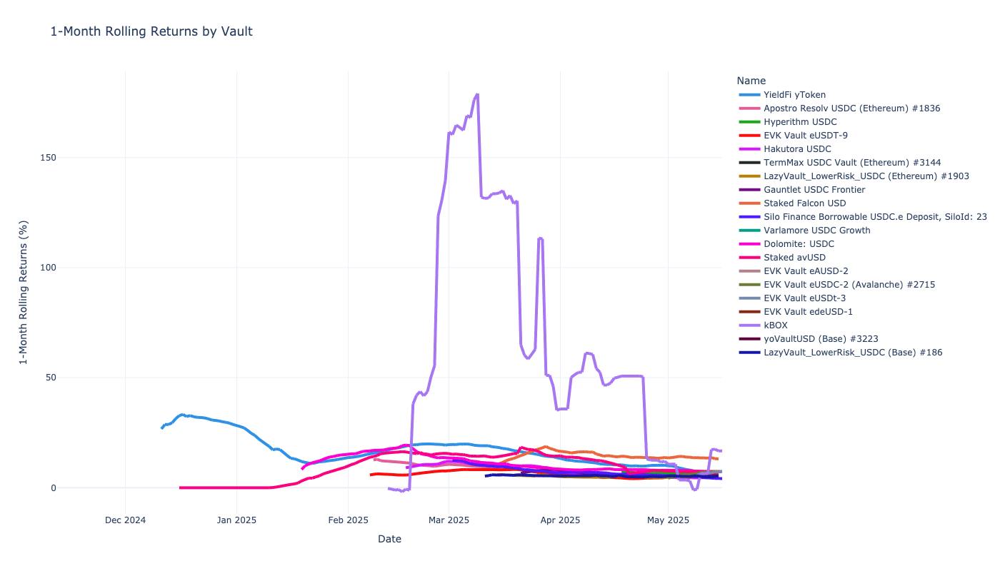

Peak returns by


timestamp                                                  2025-03-09 00:00:00
chain                                                                       56
address                             0x6e7a6eb5feec64bf6401a744757aba89c5c7e813
block_number                                                     47,289,065.00
share_price                                                               1.07
total_assets                                                      5,741,719.39
total_supply                                                      5,387,587.41
performance_fee                                                            NaN
management_fee                                                             NaN
errors                                                                        
id                               56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813
name                                                                      kBOX
event_count                                         

In [76]:
import plotly.express as px
from plotly.colors import qualitative 


benchmark_count: int = 20


def calculate_rolling_returns(
    returns_df: pd.DataFrame,
    interesting_vaults: pd.Series | None,
    window: int = 30,  # Bars
    period: pd.Timedelta = pd.Timedelta(days=365),    
    cap: float = None,
    clip_down: float=None,
    clip_up: float=None,
    drop_threshold: float = None,
):
    
    # Limit to benchmarked vaults
    if interesting_vaults is not None:
        df = returns_df[returns_df["id"].isin(interesting_vaults)]
    else:
        df = returns_df
    df = df.reset_index().sort_values(by=["id", "timestamp"])

    # Manually blacklist one vault where we get data until fixed
    df = df[df["name"] != "Revert Lend Arbitrum USDC,"]

    # Limit chart width
    df = df.loc[df["timestamp"] >= (pd.Timestamp.now() - period)]

    # Calculate rollling returns
    df['rolling_1m_returns'] = df.groupby('id')['daily_returns'].transform(
        lambda x: (((1 + x).rolling(window=window).apply(np.prod) - 1) * 100)
    )

    df['rolling_1m_returns_annualized'] = ((1 + df['rolling_1m_returns']/100) ** 12 - 1) * 100

    # When vault launches it has usually near-infinite APY
    # Cap it here so charts are readable
    if cap is not None:
        # Using mask (replaces values WHERE condition is True)
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].mask(
            (df['rolling_1m_returns_annualized'] > cap) | (df['rolling_1m_returns_annualized'] < -cap), 
            np.nan
        )

    if clip_down is not None:
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].clip(lower=clip_down)

    if clip_up is not None:
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].clip(upper=clip_up)

    if drop_threshold is not None:
        # Step 1: Identify vaults with extreme returns
        extreme_return_vaults = returns_df.groupby('name')['daily_returns'].apply(
            lambda x: (x > 1000).any()
        )
        extreme_return_names = extreme_return_vaults[extreme_return_vaults].index.tolist()

        print("Removing extreme return vaults: ", extreme_return_names)

        # Step 2: Filter the DataFrame to exclude these vaults
        df = df[~df['name'].isin(extreme_return_names)]
        
    return df


interesting_vaults = lifetime_data_filtered_df[0:benchmark_count]["id"]
df = rolling_returns_df = all_rolling_returns_df = calculate_rolling_returns(
    returns_df, 
    interesting_vaults=interesting_vaults,
    clip_up=700,
)

# Report manual fee data gathering needed
lack_fees_df = df[df["performance_fee"].isna()]
print(f"We lack perf fee data for {len(lack_fees_df['id'].unique()):,} / {len(interesting_vaults)} vaults")

# display(df.head(2))

fig = px.line(df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title='1-Month Rolling Returns by Vault',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default,
)

fig.update_traces(line=dict(width=4))


fig.show()

max_row = df.loc[df['rolling_1m_returns'].idxmax()]
print("Peak returns by")
display(max_row)

### All vaults, excluding volatile

- Exclude gDAI to see other vaults better in the chart



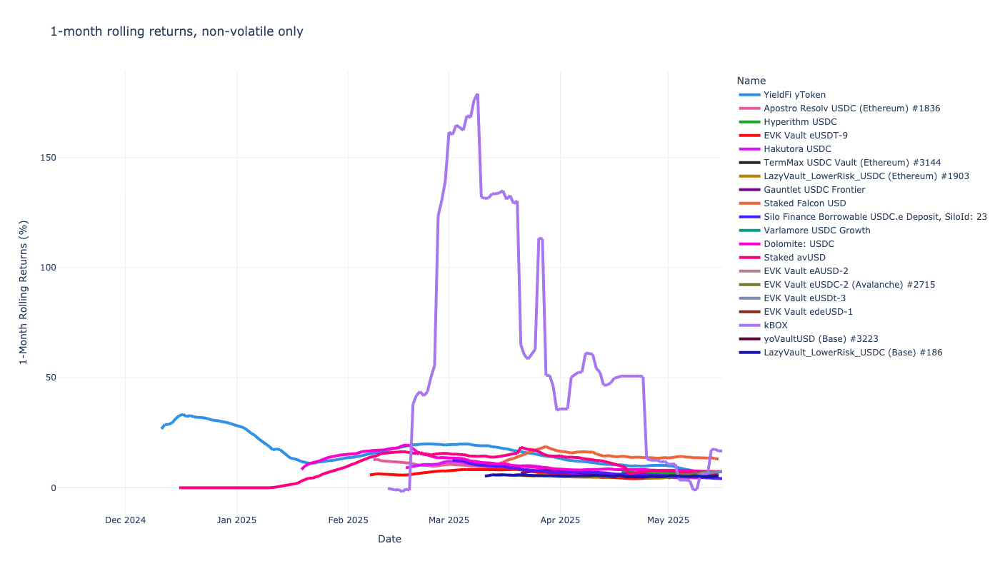

Peak returns by


timestamp                                                  2025-03-09 00:00:00
chain                                                                       56
address                             0x6e7a6eb5feec64bf6401a744757aba89c5c7e813
block_number                                                     47,289,065.00
share_price                                                               1.07
total_assets                                                      5,741,719.39
total_supply                                                      5,387,587.41
performance_fee                                                            NaN
management_fee                                                             NaN
errors                                                                        
id                               56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813
name                                                                      kBOX
event_count                                         

In [77]:
# TODO: Fix with better filtering
non_volatile_df = all_rolling_returns_df
non_volatile_df = non_volatile_df[non_volatile_df["name"].str.contains("Gains") == False]
non_volatile_df = non_volatile_df[non_volatile_df["name"].str.contains("ostium") == False]

fig = px.line(non_volatile_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title='1-month rolling returns, non-volatile only',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=4))

fig.show()

max_row = df.loc[df['rolling_1m_returns'].idxmax()]
print("Peak returns by")
display(max_row)

### All vaults, volatile only

- Benchmark market-making and such vaults against each other across chains.

Top volatile vaults


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
None (Ethereum) #3284,947.86%,26.06%,947.86%,0.0230,USDC,Ethereum,"815,942.52","815,942.52",0.10,unknown,unknown,57.0,<unknown ERC-4626>,1-0x4f95c5ba0c7c69fb2f9340e190ccee890b3bd87c,26.06%,2025-04-09,2025-05-15
cSuperior Quality Private Credit USDC,56.75%,29.49%,42.43%,0.0016,USDC,Ethereum,"251,714.97","237,669.81",0.57,unknown,unknown,72.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,22.55%,2025-02-17,2025-05-15
kBOX,41.37%,12.26%,42.02%,0.0051,VUSD,Binance,"6,119,183.47","5,568,010.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,12.43%,2025-02-17,2025-05-16
USDS Compound V3 Lender,56.19%,20.10%,25.23%,0.0032,USDS,Ethereum,"1,921,612.44","468,564.78",0.41,unknown,unknown,104.0,<unknown ERC-4626>,1-0x6701dea9809deaf068b8445798d0e19b025480fe,9.68%,2025-02-17,2025-05-15
HYPE++,46.47%,20.07%,21.93%,0.0059,USDC,Arbitrum,"2,500,000.00","2,500,000.00",0.48,unknown,unknown,124.0,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,9.97%,2025-02-17,2025-05-15
Spectra ERC4626 Wrapper: Wrapped Ultimate Synthetic Delta Neutral,18.75%,2.57%,18.75%,0.0012,USDN,Ethereum,"493,031.02","493,031.02",0.15,unknown,unknown,138.0,<unknown ERC-4626>,1-0x06a491e3efee37eb191d0434f54be6e42509f9d3,2.57%,2025-03-22,2025-05-15


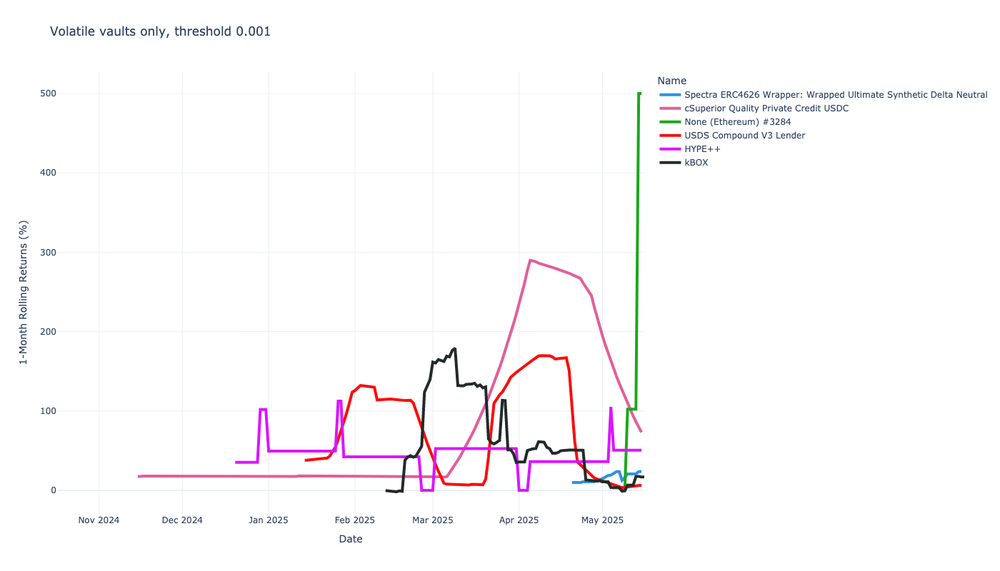

In [78]:
volatility_threshold = 0.001
benchmark_count = 20
nav_threshold = 25_000
lifetime_data_filtered_df = lifetime_data_df[
    (lifetime_data_df['current_nav'] >= nav_threshold) &
    (lifetime_data_df['event_count'] >= event_threshold)
]

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df['current_nav'] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df['three_months_volatility'] > volatility_threshold]

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]


rolling_returns_df = calculate_rolling_returns(
    returns_df, 
    interesting_vaults=set(interesting_vaults["id"]),
    clip_down=-20,
    clip_up=500,
    window=30,
    )

print("Top volatile vaults")
display(format_lifetime_table(interesting_vaults))

fig = px.line(rolling_returns_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title=f'Volatile vaults only, threshold {volatility_threshold}',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )


fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=4))

fig.show()



### All vaults, volatile only, filtering extreme results

- Better representative of volatile vaults with more NAV filering
- Remove vaults with seemingly bad returns
- TODO: This seems be very difficult to analyse

Total 20 interesting volatile vaults: ['None (Ethereum) #3284', 'kBOX', 'HYPE++', 'Gains Network USDC', 'Gains Network DAI', 'BasisOS USDC-WBTC Hyperliquid', 'hsUSDC', 'gmUSDC (Arbitrum) #825', 'ostiumLP', 'Gains Network DAI (Polygon) #2214', 'Gains Network USDC (Arbitrum) #793', 'Gains Network USDC (Polygon) #2422', 'fija USDC GMXv2 FC (Arbitrum) #882', 'fija Strategy USDC GMXv2 (Arbitrum) #1256', 'kUSDT', 'dgnBeraland', 'kUSDC', 'FJ_20230712_xxxxxx', 'Revert Lend Arbitrum USDC,', 'None (Ethereum) #1909']
Removing extreme return vaults:  []
Top 20 volatile vaults by the lat returns 


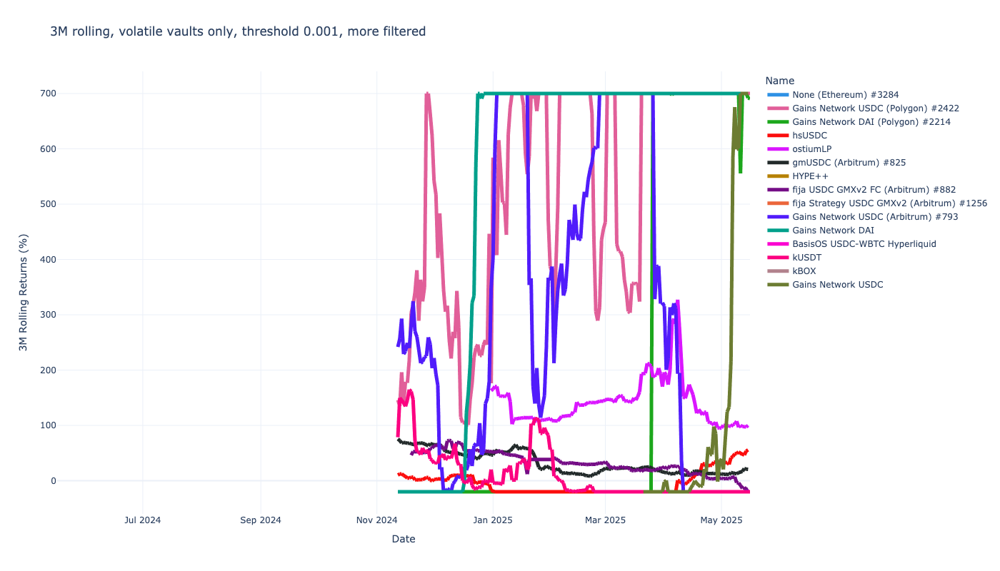

In [79]:
bad_returns_threshold = 900
benchmark_count = 15  # By the last 1-month returns
nav_threshold = 500_000

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df['current_nav'] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

# lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df['three_months_volatility'] > volatility_threshold]

# display(interesting_vaults)

print(f"Total {len(interesting_vaults)} interesting volatile vaults: {interesting_vaults.index.tolist()}")

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]

rolling_returns_df = calculate_rolling_returns(
    returns_df, 
    interesting_vaults=interesting_vaults["id"],
    clip_down=-20,
    clip_up=700,
    window=180,
    drop_threshold=100,
    )


print("Top 20 volatile vaults by the lat returns ")

fig = px.line(rolling_returns_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title=f'3M rolling, volatile vaults only, threshold {volatility_threshold}, more filtered',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )


fig.update_layout(
    xaxis_title='Date',
    yaxis_title='3M Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=5))

fig.show()


## Top vaults by chain

- Show 1 month rolling returns of top vaults for all chains chain


### Base

Base: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
POPT-V1.1 USDC LP on ETH/USDC 5bps (Base) #3227,37.02%,1.39%,37.02%,0.0009,"46,052.05","46,052.05",0.04,unknown,unknown,85.0,Panoptic,8453-0xabbad7a755bdf9bbec357e2bdf4c02934a8d7a71,1.39%,2025-04-29,2025-05-15
Vault (Base) #174,37.29%,9.54%,27.38%,0.0004,"1,860,740.81","1,569,804.49",0.29,unknown,unknown,"1,242.0",<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,7.21%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 42,28.46%,6.37%,26.70%,0.0003,"93,761.20","28,852.59",0.25,unknown,unknown,"1,954.0",Peapods,8453-0x4b5c90dc6bc08a10a24487726e614e9d148362e1,6.00%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 15,23.55%,5.72%,22.04%,0.0005,"91,617.57","70,255.26",0.26,unknown,unknown,"12,776.0",Peapods,8453-0x6ea0bfff586f2f226c80cc98275b810d2cd95771,5.38%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 67,19.50%,2.47%,19.50%,0.0002,"168,233.52","137,595.08",0.14,unknown,unknown,"1,936.0",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2.47%,2025-03-26,2025-05-15
Peapods Interest Bearing USDC - 7,19.32%,5.16%,17.61%,0.0008,"55,284.01","41,027.85",0.28,unknown,unknown,324.0,Peapods,8453-0x9c77e29e59ce30445048fa653442ee296442c350,4.73%,2025-02-17,2025-05-15
Gains Network USDC,-96.41%,-88.12%,13.84%,0.0165,"4,936,901.59","3,208,368.80",0.64,unknown,unknown,"1,520.0",<unknown ERC-4626>,8453-0xad20523a7dc37babc1cc74897e4977232b3d02e5,8.66%,2025-02-17,2025-05-15
maxAPY USD Share (Base) #3129,13.63%,0.95%,13.63%,0.0004,"323,606.28","276,501.33",0.07,unknown,unknown,551.0,Superform,8453-0x7a63e8fc1d0a5e9be52f05817e8c49d9e2d6efae,0.95%,2025-04-18,2025-05-15
DeTrade Core USDC,9.87%,1.72%,9.87%,0.0008,"340,233.52","329,552.08",0.18,unknown,unknown,30.0,Lagoon,8453-0x8092ca384d44260ea4feaf7457b629b8dc6f88f0,1.72%,2025-03-10,2025-05-15


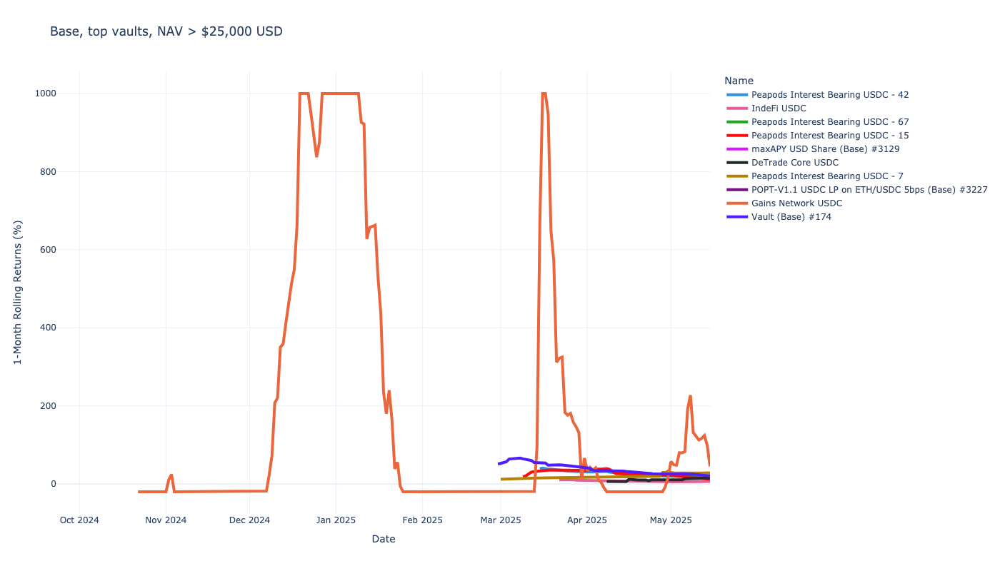

Base: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
POPT-V1.1 USDC LP on ETH/USDC 5bps (Base) #3227,37.02%,1.39%,37.02%,0.0009,"46,052.05","46,052.05",0.04,unknown,unknown,85.0,Panoptic,8453-0xabbad7a755bdf9bbec357e2bdf4c02934a8d7a71,1.39%,2025-04-29,2025-05-15
Vault (Base) #174,37.29%,9.54%,27.38%,0.0004,"1,860,740.81","1,569,804.49",0.29,unknown,unknown,"1,242.0",<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,7.21%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 42,28.46%,6.37%,26.70%,0.0003,"93,761.20","28,852.59",0.25,unknown,unknown,"1,954.0",Peapods,8453-0x4b5c90dc6bc08a10a24487726e614e9d148362e1,6.00%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 15,23.55%,5.72%,22.04%,0.0005,"91,617.57","70,255.26",0.26,unknown,unknown,"12,776.0",Peapods,8453-0x6ea0bfff586f2f226c80cc98275b810d2cd95771,5.38%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 67,19.50%,2.47%,19.50%,0.0002,"168,233.52","137,595.08",0.14,unknown,unknown,"1,936.0",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2.47%,2025-03-26,2025-05-15


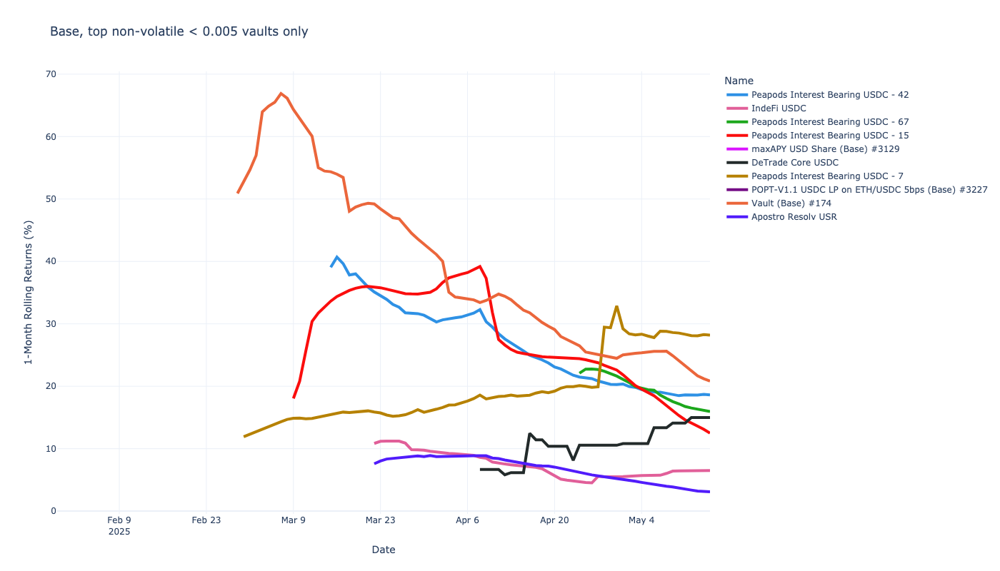

### Ethereum

Ethereum: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
None (Ethereum) #3284,947.86%,26.06%,947.86%,0.0230,"815,942.52","815,942.52",0.10,unknown,unknown,57.0,<unknown ERC-4626>,1-0x4f95c5ba0c7c69fb2f9340e190ccee890b3bd87c,26.06%,2025-04-09,2025-05-15
Peapods Interest Bearing USDC - 24 (Ethereum) #3287,49.76%,1.45%,49.76%,0.0007,"1,607,708.23","1,607,708.23",0.04,unknown,unknown,155.0,Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,1.45%,2025-05-02,2025-05-15
cSuperior Quality Private Credit USDC,56.75%,29.49%,42.43%,0.0016,"251,714.97","237,669.81",0.57,unknown,unknown,72.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,22.55%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 21,25.86%,3.52%,25.86%,0.0004,"83,846.99","67,756.54",0.15,unknown,unknown,553.0,Peapods,1-0xf419c7674536f6b32b9a73929dbf4ff5c2386d5c,3.52%,2025-03-21,2025-05-15
USDS Compound V3 Lender,56.19%,20.10%,25.23%,0.0032,"1,921,612.44","468,564.78",0.41,unknown,unknown,104.0,<unknown ERC-4626>,1-0x6701dea9809deaf068b8445798d0e19b025480fe,9.68%,2025-02-17,2025-05-15
Duplicated Key,22.64%,4.40%,22.64%,0.0006,"57,237.58","57,237.58",0.21,0.00%,12.00%,30.0,Morpho,1-0x0b6c8ef0de1be5ed1b59e6e7a67fb9442fb9e49c,4.40%,2025-02-27,2025-05-15
Spectra ERC4626 Wrapper: Wrapped Ultimate Synthetic Delta Neutral,18.75%,2.57%,18.75%,0.0012,"493,031.02","493,031.02",0.15,unknown,unknown,138.0,<unknown ERC-4626>,1-0x06a491e3efee37eb191d0434f54be6e42509f9d3,2.57%,2025-03-22,2025-05-15
Staked Falcon USD,13.23%,3.11%,13.23%,0.0002,"224,272,760.46","218,725,211.94",0.25,unknown,unknown,"4,406.0",<unknown ERC-4626>,1-0xc8cf6d7991f15525488b2a83df53468d682ba4b0,3.11%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 22 (Ethereum) #3145,8.88%,0.70%,8.88%,0.0001,"30,833.21","27,052.60",0.08,unknown,unknown,298.0,Peapods,1-0x8f135bcfc4084ce6c8620e87b12c4ee82d165276,0.70%,2025-04-15,2025-05-15


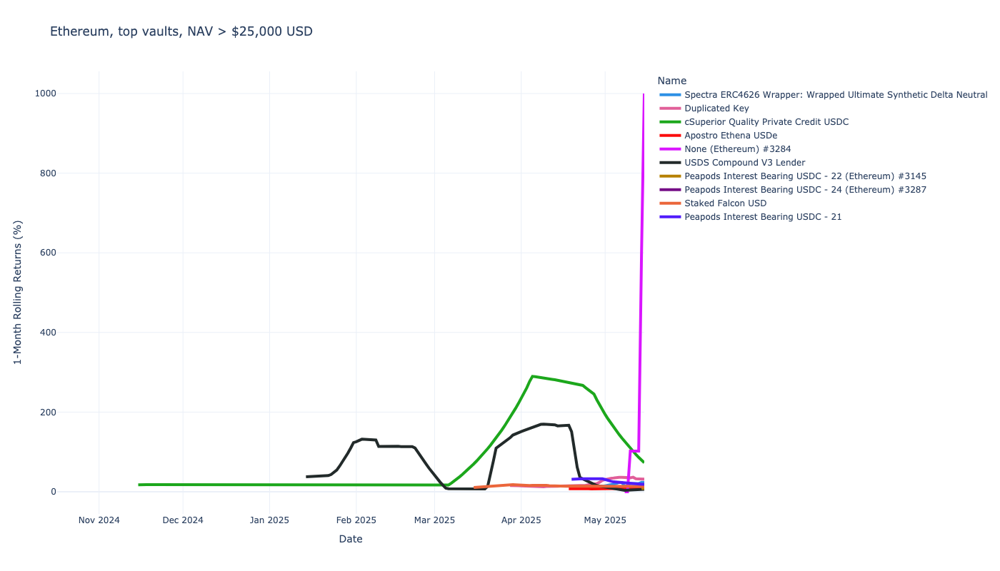

Ethereum: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 24 (Ethereum) #3287,49.76%,1.45%,49.76%,0.0007,"1,607,708.23","1,607,708.23",0.04,unknown,unknown,155.0,Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,1.45%,2025-05-02,2025-05-15
cSuperior Quality Private Credit USDC,56.75%,29.49%,42.43%,0.0016,"251,714.97","237,669.81",0.57,unknown,unknown,72.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,22.55%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 21,25.86%,3.52%,25.86%,0.0004,"83,846.99","67,756.54",0.15,unknown,unknown,553.0,Peapods,1-0xf419c7674536f6b32b9a73929dbf4ff5c2386d5c,3.52%,2025-03-21,2025-05-15
USDS Compound V3 Lender,56.19%,20.10%,25.23%,0.0032,"1,921,612.44","468,564.78",0.41,unknown,unknown,104.0,<unknown ERC-4626>,1-0x6701dea9809deaf068b8445798d0e19b025480fe,9.68%,2025-02-17,2025-05-15
Duplicated Key,22.64%,4.40%,22.64%,0.0006,"57,237.58","57,237.58",0.21,0.00%,12.00%,30.0,Morpho,1-0x0b6c8ef0de1be5ed1b59e6e7a67fb9442fb9e49c,4.40%,2025-02-27,2025-05-15


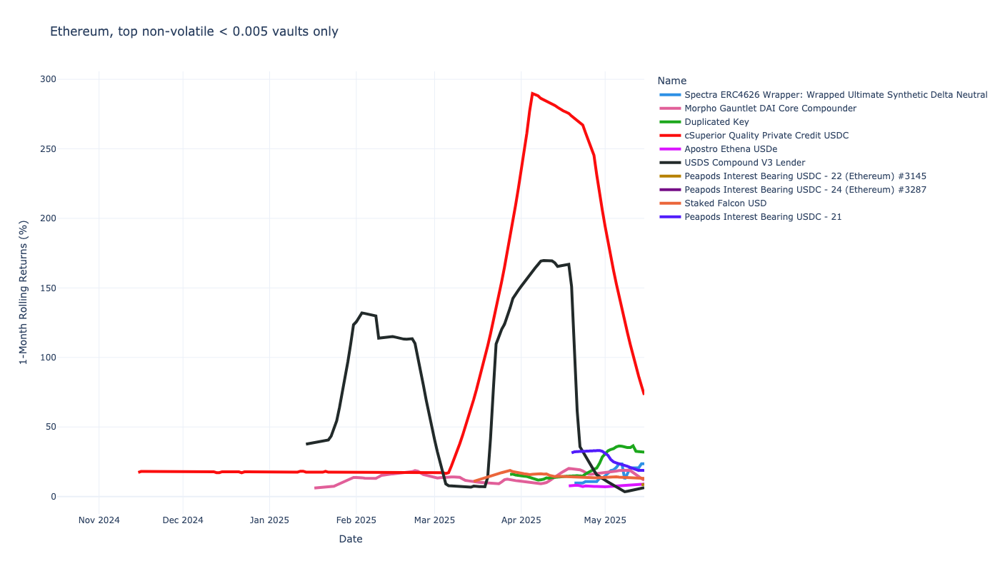

### Arbitrum

Arbitrum: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
HYPE++,46.47%,20.07%,21.93%,0.0059,"2,500,000.00","2,500,000.00",0.48,unknown,unknown,124.0,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,9.97%,2025-02-17,2025-05-15
Peapods Interest Bearing USDC - 6,21.09%,5.10%,19.97%,0.0005,"2,619,178.82","2,619,178.82",0.26,unknown,unknown,"1,973.0",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,4.85%,2025-02-17,2025-05-15
Plutus Hedge Token,7.09%,1.97%,7.09%,0.0019,"98,804.74","98,804.74",0.28,unknown,unknown,31.0,<unknown ERC-4626>,42161-0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a,1.97%,2025-02-17,2025-05-15
Gains Network DAI,10.42%,26.48%,6.08%,0.0113,"43,381,428.73","3,279,109.60",2.37,unknown,unknown,"24,656.0",<unknown ERC-4626>,42161-0xd85e038593d7a098614721eae955ec2022b9b91b,15.02%,2025-02-17,2025-05-15
BasisOS USDC-WBTC Hyperliquid,5.83%,0.95%,5.83%,0.0413,"1,956,248.71","1,956,248.71",0.17,unknown,unknown,667.0,<unknown ERC-4626>,42161-0xe5fc579f20c2dbffd78a92ddd124871a35519659,0.95%,2025-03-15,2025-05-15
Dolomite: USDC,10.75%,4.14%,5.16%,0.0001,"16,436,401.25","10,116,758.52",0.40,unknown,unknown,52.0,<unknown ERC-4626>,42161-0x444868b6e8079ac2c55eea115250f92c2b2c4d14,2.02%,2025-02-17,2025-05-15
Yield Chasing USDC,7.46%,2.68%,4.90%,0.0001,"340,087.95","122,198.17",0.37,unknown,unknown,232.0,<unknown ERC-4626>,42161-0x0df2e3a0b5997adc69f8768e495fd98a4d00f134,1.77%,2025-02-17,2025-05-15
Yield Chasing crvUSD,14.37%,7.28%,4.46%,0.0002,"375,408.26","375,408.26",0.52,unknown,unknown,233.0,<unknown ERC-4626>,42161-0xa7781f1d982eb9000bc1733e29ff5ba2824cdbe5,2.31%,2025-02-17,2025-05-15
LazyVault_LowerRisk_USDC (Arbitrum) #1300,4.36%,0.68%,4.36%,0.0000,"7,269,812.47","5,682,847.43",0.16,unknown,unknown,607.0,<unknown ERC-4626>,42161-0x4f63cfea7458221cb3a0eee2f31f7424ad34bb58,0.68%,2025-03-18,2025-05-15


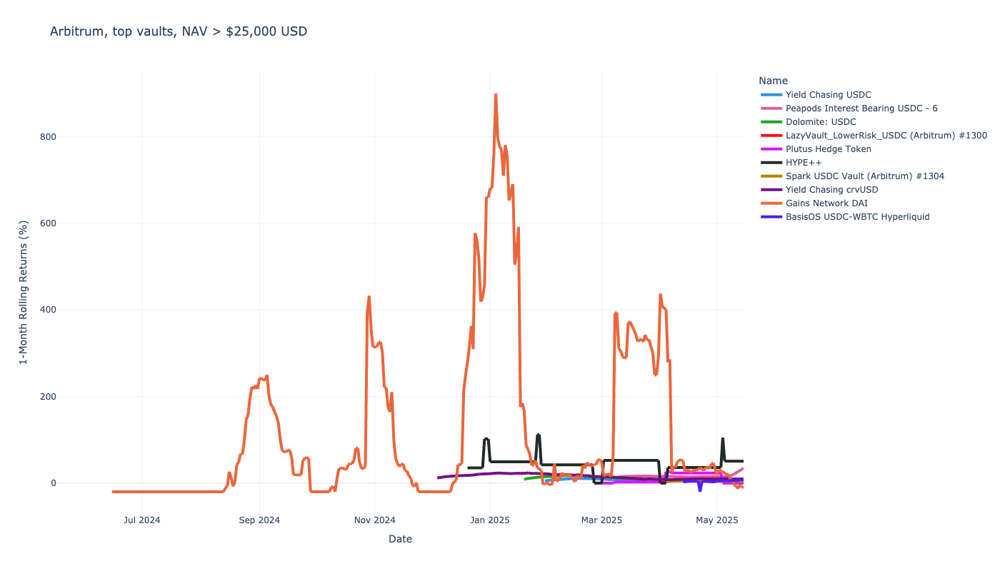

Arbitrum: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 6,21.09%,5.10%,19.97%,0.0005,"2,619,178.82","2,619,178.82",0.26,unknown,unknown,"1,973.0",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,4.85%,2025-02-17,2025-05-15
Plutus Hedge Token,7.09%,1.97%,7.09%,0.0019,"98,804.74","98,804.74",0.28,unknown,unknown,31.0,<unknown ERC-4626>,42161-0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a,1.97%,2025-02-17,2025-05-15
Dolomite: USDC,10.75%,4.14%,5.16%,0.0001,"16,436,401.25","10,116,758.52",0.40,unknown,unknown,52.0,<unknown ERC-4626>,42161-0x444868b6e8079ac2c55eea115250f92c2b2c4d14,2.02%,2025-02-17,2025-05-15
Yield Chasing USDC,7.46%,2.68%,4.90%,0.0001,"340,087.95","122,198.17",0.37,unknown,unknown,232.0,<unknown ERC-4626>,42161-0x0df2e3a0b5997adc69f8768e495fd98a4d00f134,1.77%,2025-02-17,2025-05-15
Yield Chasing crvUSD,14.37%,7.28%,4.46%,0.0002,"375,408.26","375,408.26",0.52,unknown,unknown,233.0,<unknown ERC-4626>,42161-0xa7781f1d982eb9000bc1733e29ff5ba2824cdbe5,2.31%,2025-02-17,2025-05-15


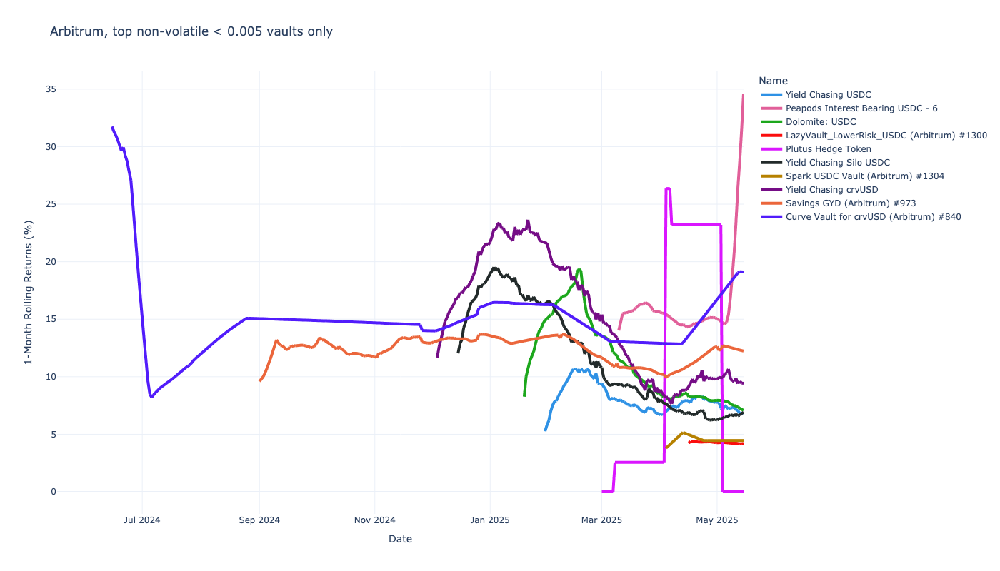

### Polygon

Polygon: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Polygon) #2493,13.38%,6.75%,5.37%,0.0001,"82,352.29","62,749.61",0.52,unknown,unknown,59.0,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2.76%,2025-02-17,2025-05-16
Ensuro MSV V2 (Polygon) #2504,4.44%,1.63%,2.41%,0.0000,"1,604,555.62","1,598,715.58",0.37,unknown,unknown,"1,336.0",<unknown ERC-4626>,137-0x14f6dfee761455247c6bf2b2b052a1f6245dd6fb,0.89%,2025-02-17,2025-05-16
Gains Network DAI (Polygon) #2214,24.76%,70.50%,1.28%,0.0037,"16,593,555.19","897,604.86",2.41,unknown,unknown,"21,666.0",<unknown ERC-4626>,137-0x91993f2101cc758d0deb7279d41e880f7defe827,3.12%,2025-02-17,2025-05-16
USDC-1 yVault (Polygon) #2459,7.98%,8.11%,1.19%,0.0001,"6,774,871.16","306,125.98",1.02,unknown,unknown,"19,643.0",Yearn v3,137-0x34b9421fe3d52191b64bc32ec1ab764dcbcdbf5e,1.21%,2025-02-17,2025-05-16
Cool Wallet AAVEv3 USDT (Polygon) #2457,3.51%,2.94%,0.88%,0.0000,"1,826,730.29","1,824,988.13",0.84,unknown,unknown,721.0,Kiln Metavault,137-0x03441c89e7b751bb570f9dc8c92702b127c52c51,0.74%,2025-02-17,2025-05-16
Static Aave Polygon USDCn,6.61%,7.70%,0.75%,0.0000,"274,319.29","107,006.72",1.16,unknown,unknown,"14,970.0",Superform,137-0x2dca80061632f3f87c9ca28364d1d0c30cd79a19,0.87%,2025-02-17,2025-05-16
Compound USDT,0.73%,0.14%,0.73%,0.0000,"17,378,526.39","16,740,694.12",0.19,0.00%,10.00%,"4,899.0",Morpho,137-0xfd06859a671c21497a2eb8c5e3fea48de924d6c8,0.14%,2025-03-07,2025-05-16
DAI yVault-A,12.45%,17.09%,0.70%,0.0000,"4,318,187.19","370,670.20",1.34,unknown,unknown,"35,643.0",Yearn v3,137-0x90b2f54c6addad41b8f6c4fccd555197bc0f773b,0.94%,2025-02-17,2025-05-16
AaveV3 DAI Lender,6.39%,9.29%,0.68%,0.0000,"4,275,324.13","430,229.83",1.43,unknown,unknown,"2,585.0",<unknown ERC-4626>,137-0xf4f9d5697341b4c9b0cc8151413e05a90f7dc24f,0.98%,2025-02-17,2025-05-16


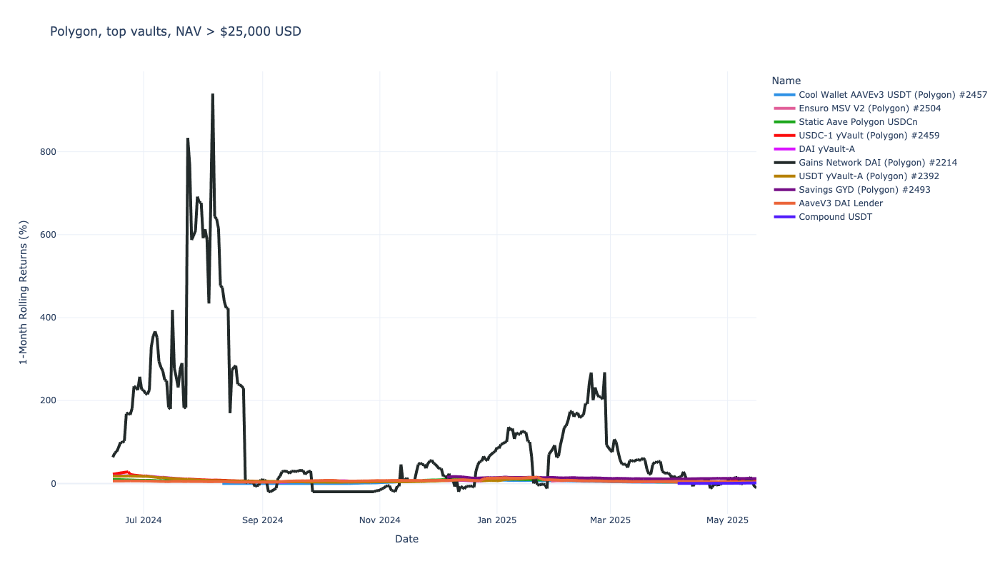

Polygon: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Polygon) #2493,13.38%,6.75%,5.37%,0.0001,"82,352.29","62,749.61",0.52,unknown,unknown,59.0,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2.76%,2025-02-17,2025-05-16
Ensuro MSV V2 (Polygon) #2504,4.44%,1.63%,2.41%,0.0000,"1,604,555.62","1,598,715.58",0.37,unknown,unknown,"1,336.0",<unknown ERC-4626>,137-0x14f6dfee761455247c6bf2b2b052a1f6245dd6fb,0.89%,2025-02-17,2025-05-16
Gains Network DAI (Polygon) #2214,24.76%,70.50%,1.28%,0.0037,"16,593,555.19","897,604.86",2.41,unknown,unknown,"21,666.0",<unknown ERC-4626>,137-0x91993f2101cc758d0deb7279d41e880f7defe827,3.12%,2025-02-17,2025-05-16
USDC-1 yVault (Polygon) #2459,7.98%,8.11%,1.19%,0.0001,"6,774,871.16","306,125.98",1.02,unknown,unknown,"19,643.0",Yearn v3,137-0x34b9421fe3d52191b64bc32ec1ab764dcbcdbf5e,1.21%,2025-02-17,2025-05-16
Cool Wallet AAVEv3 USDT (Polygon) #2457,3.51%,2.94%,0.88%,0.0000,"1,826,730.29","1,824,988.13",0.84,unknown,unknown,721.0,Kiln Metavault,137-0x03441c89e7b751bb570f9dc8c92702b127c52c51,0.74%,2025-02-17,2025-05-16


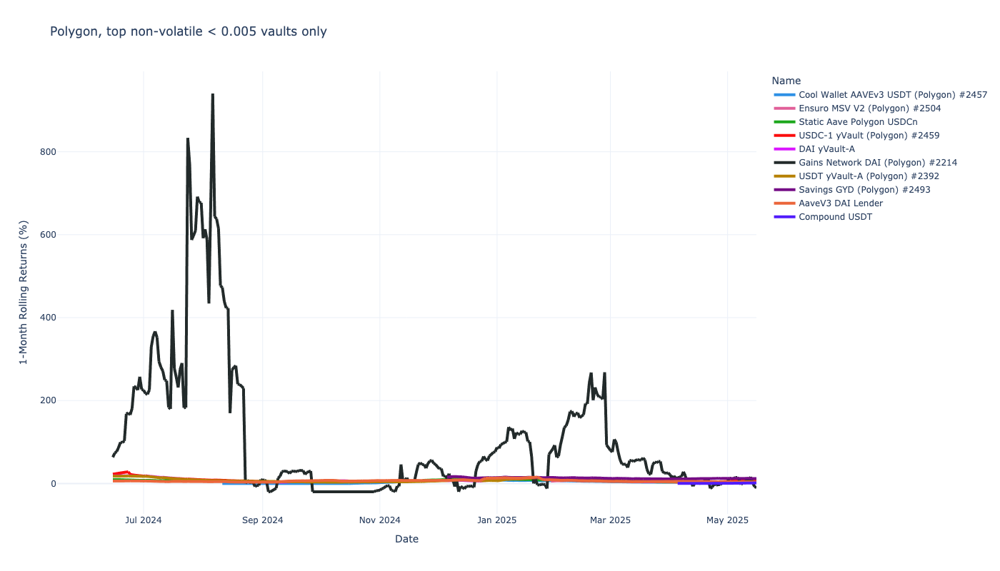

### Optimism

Optimism: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
40op-USDC-Vault,27.95%,5.55%,27.95%,0.0005,"529,372.61","445,848.81",0.22,unknown,unknown,345.0,<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,5.55%,2025-02-24,2025-05-15
PoolTogether USDC winETH,3.36%,1.93%,3.16%,0.0004,"3,144,851.97","346,830.37",0.58,unknown,unknown,"3,012.0",<unknown ERC-4626>,10-0x11271bf9855b679bc484a0c80a69d8cc72fcef89,1.81%,2025-02-17,2025-05-15
ERC4626-Wrapped Aave v3 USDC (Optimism) #3060,6.18%,3.52%,1.36%,0.0000,"3,144,851.97","346,830.37",0.58,unknown,unknown,"3,050.0",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,0.79%,2025-02-17,2025-05-15
Staked USDA (Optimism) #3015,8.80%,11.98%,1.09%,0.0000,"3,119,952.57","101,929.74",1.34,unknown,unknown,798.0,<unknown ERC-4626>,10-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,1.47%,2025-02-17,2025-05-15
Wrapped Mountain Protocol USD (Optimism) #3028,3.51%,3.39%,1.03%,0.0000,"977,346.56","78,649.37",0.97,unknown,unknown,"52,587.0",<unknown ERC-4626>,10-0x57f5e098cad7a3d1eed53991d4d66c45c9af7812,0.99%,2025-02-17,2025-05-15
exactly USDC.e,6.81%,15.58%,0.95%,0.0000,"84,340,403.48","283,157.06",2.20,unknown,unknown,"37,823.0",<unknown ERC-4626>,10-0x81c9a7b55a4df39a9b7b5f781ec0e53539694873,2.09%,2025-02-17,2025-05-15
Aave V3 DAI Lender (Optimism) #3047,5.56%,4.19%,0.87%,0.0001,"114,228.08","25,167.74",0.76,unknown,unknown,110.0,<unknown ERC-4626>,10-0x91e6c36992380017aecc91b0c21b0fbf4bb4fdd6,0.66%,2025-02-17,2025-05-15
exactly USDC (Optimism) #3025,5.90%,6.36%,0.79%,0.0000,"14,745,678.02","3,873,673.84",1.08,unknown,unknown,"70,695.0",<unknown ERC-4626>,10-0x6926b434cce9b5b7966ae1bfeef6d0a7dcf3a8bb,0.85%,2025-02-17,2025-05-15
ERC4626-Wrapped Aave v3 USDC (Optimism) #3020,6.00%,6.45%,0.73%,0.0000,"4,970,252.30","2,132,835.62",1.07,unknown,unknown,"15,960.0",<unknown ERC-4626>,10-0xbe3b918cab6d57a40d1bfb21aeeb5ddf088f4c76,0.79%,2025-02-17,2025-05-15


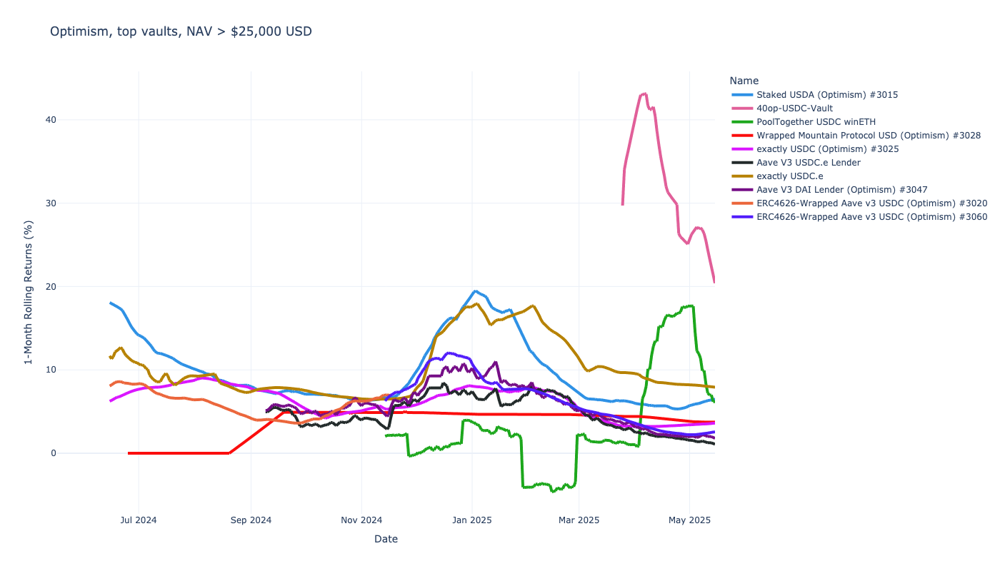

Optimism: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
40op-USDC-Vault,27.95%,5.55%,27.95%,0.0005,"529,372.61","445,848.81",0.22,unknown,unknown,345.0,<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,5.55%,2025-02-24,2025-05-15
PoolTogether USDC winETH,3.36%,1.93%,3.16%,0.0004,"3,144,851.97","346,830.37",0.58,unknown,unknown,"3,012.0",<unknown ERC-4626>,10-0x11271bf9855b679bc484a0c80a69d8cc72fcef89,1.81%,2025-02-17,2025-05-15
ERC4626-Wrapped Aave v3 USDC (Optimism) #3060,6.18%,3.52%,1.36%,0.0000,"3,144,851.97","346,830.37",0.58,unknown,unknown,"3,050.0",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,0.79%,2025-02-17,2025-05-15
Staked USDA (Optimism) #3015,8.80%,11.98%,1.09%,0.0000,"3,119,952.57","101,929.74",1.34,unknown,unknown,798.0,<unknown ERC-4626>,10-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,1.47%,2025-02-17,2025-05-15
Wrapped Mountain Protocol USD (Optimism) #3028,3.51%,3.39%,1.03%,0.0000,"977,346.56","78,649.37",0.97,unknown,unknown,"52,587.0",<unknown ERC-4626>,10-0x57f5e098cad7a3d1eed53991d4d66c45c9af7812,0.99%,2025-02-17,2025-05-15


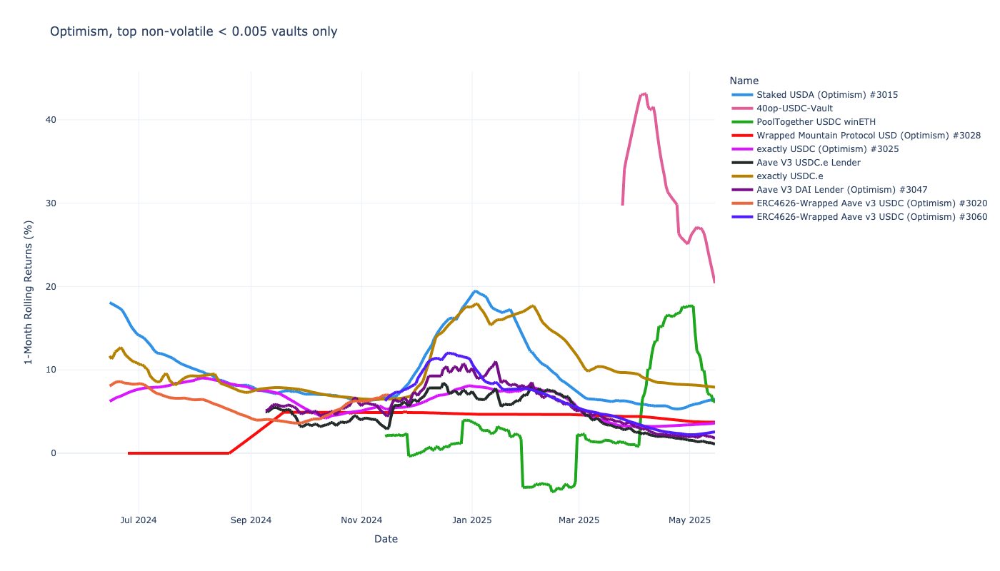

### Binance

Binance: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
kBOX,41.37%,12.26%,42.02%,0.0051,"6,119,183.47","5,568,010.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,12.43%,2025-02-17,2025-05-16
EVK Vault eUSDT-4,6.17%,0.46%,6.17%,0.0001,"1,253,718.22","938,458.02",0.08,unknown,unknown,465.0,Euler Vault Kit,56-0x69a93dbab609266af96f05658b2e22d020de2e19,0.46%,2025-04-18,2025-05-16
EVK Vault eUSDC-3 (Binance) #3151,4.62%,0.37%,4.62%,0.0000,"1,495,616.58","1,164,744.52",0.08,unknown,unknown,273.0,Euler Vault Kit,56-0xa9ca5c4bff689afcfb249ae81565422fa78f82b4,0.37%,2025-04-16,2025-05-16
EVK Vault eUSDT-5,3.76%,0.30%,3.76%,0.0000,"8,078,927.93","8,078,927.93",0.08,unknown,unknown,122.0,Euler Vault Kit,56-0xca522ecab584b5430adb946edee4224a63628362,0.30%,2025-04-16,2025-05-16
EVK Vault eUSDe-2 (Binance) #3161,3.51%,0.27%,3.51%,0.0001,"300,221.28","75,439.99",0.08,unknown,unknown,38.0,Euler Vault Kit,56-0xecd1f58b9dc4bbc3a32409961b8520b0a8fcd483,0.27%,2025-04-17,2025-05-16
EVK Vault eUSDT-3 (Binance) #3154,2.98%,0.24%,2.98%,0.0000,"2,109,221.13","1,481,230.75",0.08,unknown,unknown,431.0,Euler Vault Kit,56-0x5fd02479f938929f6b9fe1b7af6430cfd4afa6aa,0.24%,2025-04-16,2025-05-16
EVK Vault eUSDC-1 (Binance) #3150,2.13%,0.22%,2.13%,0.0000,"1,208,884.78","924,781.71",0.10,unknown,unknown,284.0,Euler Vault Kit,56-0xd98125a23faeb48180e33ca6eef8f128e07418d1,0.22%,2025-04-08,2025-05-16
EVK Vault eYUSD-2,2.09%,0.15%,2.09%,0.0000,"2,221,438.18","1,761,547.40",0.07,unknown,unknown,463.0,Euler Vault Kit,56-0xc4db46b082b415c16c54c91c5750df8e2f90ef36,0.15%,2025-04-19,2025-05-16
Saving USX (Binance) #2051,9.52%,8.34%,1.99%,0.0000,"240,849.03","90,269.43",0.88,unknown,unknown,90.0,<unknown ERC-4626>,56-0xbc404429558292ee2d769e57d57d6e74bbd2792d,1.75%,2025-02-17,2025-05-16


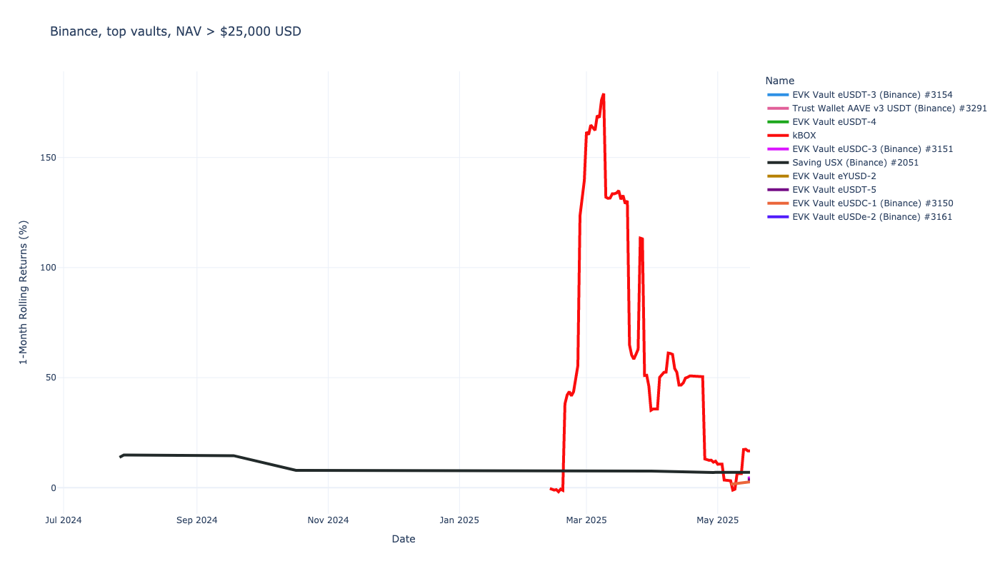

Binance: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
EVK Vault eUSDT-4,6.17%,0.46%,6.17%,0.0001,"1,253,718.22","938,458.02",0.08,unknown,unknown,465.0,Euler Vault Kit,56-0x69a93dbab609266af96f05658b2e22d020de2e19,0.46%,2025-04-18,2025-05-16
EVK Vault eUSDC-3 (Binance) #3151,4.62%,0.37%,4.62%,0.0000,"1,495,616.58","1,164,744.52",0.08,unknown,unknown,273.0,Euler Vault Kit,56-0xa9ca5c4bff689afcfb249ae81565422fa78f82b4,0.37%,2025-04-16,2025-05-16
EVK Vault eUSDT-5,3.76%,0.30%,3.76%,0.0000,"8,078,927.93","8,078,927.93",0.08,unknown,unknown,122.0,Euler Vault Kit,56-0xca522ecab584b5430adb946edee4224a63628362,0.30%,2025-04-16,2025-05-16
EVK Vault eUSDe-2 (Binance) #3161,3.51%,0.27%,3.51%,0.0001,"300,221.28","75,439.99",0.08,unknown,unknown,38.0,Euler Vault Kit,56-0xecd1f58b9dc4bbc3a32409961b8520b0a8fcd483,0.27%,2025-04-17,2025-05-16
EVK Vault eUSDT-3 (Binance) #3154,2.98%,0.24%,2.98%,0.0000,"2,109,221.13","1,481,230.75",0.08,unknown,unknown,431.0,Euler Vault Kit,56-0x5fd02479f938929f6b9fe1b7af6430cfd4afa6aa,0.24%,2025-04-16,2025-05-16


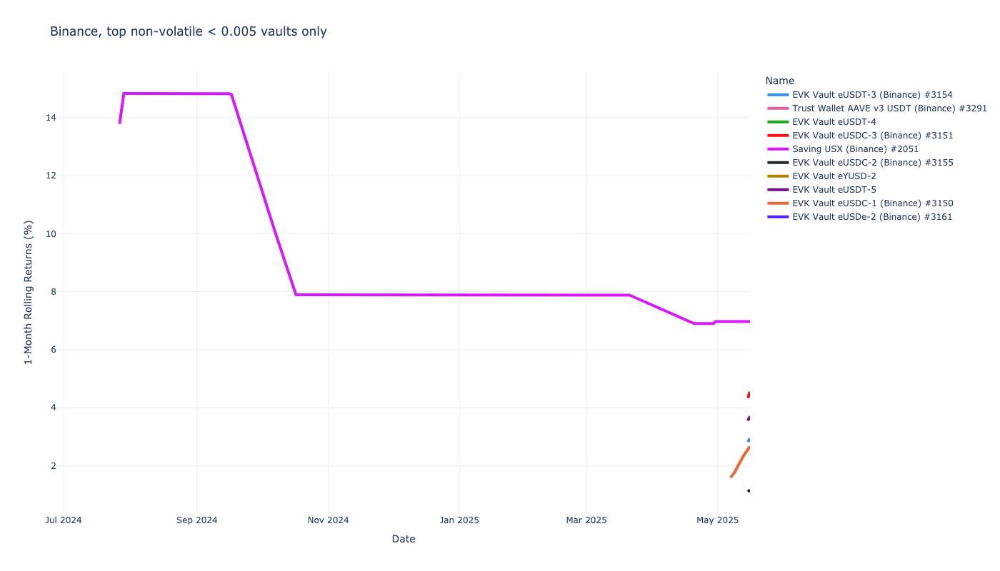

### Blast

Blast: Displaying top 5 vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Wasabi USDB Vault,12.19%,14.72%,1.01%,0.0001,"53,857,471.56","1,331,579.23",1.19,unknown,unknown,"93,008.0",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,1.20%,2025-02-17,2025-05-15
Hyper USDB,7.88%,8.98%,0.94%,0.0000,"5,122,939.24","387,091.81",1.13,unknown,unknown,"39,641.0",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,1.07%,2025-02-17,2025-05-15
ybUSDB (Blast) #2742,8.25%,10.02%,0.88%,0.0000,"1,740,737.67","72,766.18",1.20,unknown,unknown,"21,967.0",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,1.07%,2025-02-17,2025-05-15
Vault Tranche USDB,-4.33%,-5.10%,0.00%,0.0000,"14,291,856.49","37,728.20",1.18,unknown,unknown,"42,998.0",Gains Network,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,0.00%,2025-02-17,2025-05-15


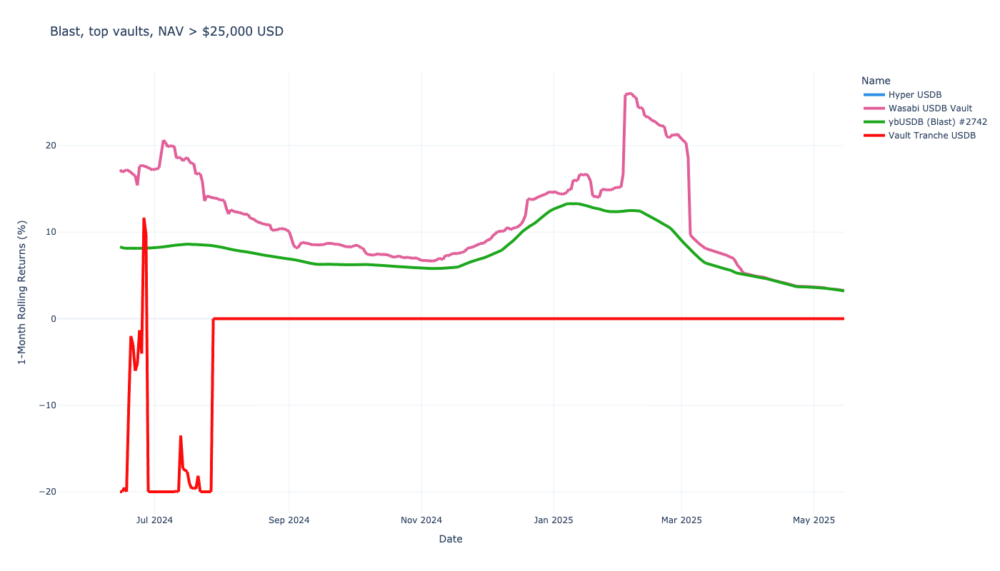

Blast: Displaying top 5 non-volatile vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Wasabi USDB Vault,12.19%,14.72%,1.01%,0.0001,"53,857,471.56","1,331,579.23",1.19,unknown,unknown,"93,008.0",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,1.20%,2025-02-17,2025-05-15
Hyper USDB,7.88%,8.98%,0.94%,0.0000,"5,122,939.24","387,091.81",1.13,unknown,unknown,"39,641.0",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,1.07%,2025-02-17,2025-05-15
ybUSDB (Blast) #2742,8.25%,10.02%,0.88%,0.0000,"1,740,737.67","72,766.18",1.20,unknown,unknown,"21,967.0",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,1.07%,2025-02-17,2025-05-15
Vault Tranche USDB,-4.33%,-5.10%,0.00%,0.0000,"14,291,856.49","37,728.20",1.18,unknown,unknown,"42,998.0",Gains Network,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,0.00%,2025-02-17,2025-05-15


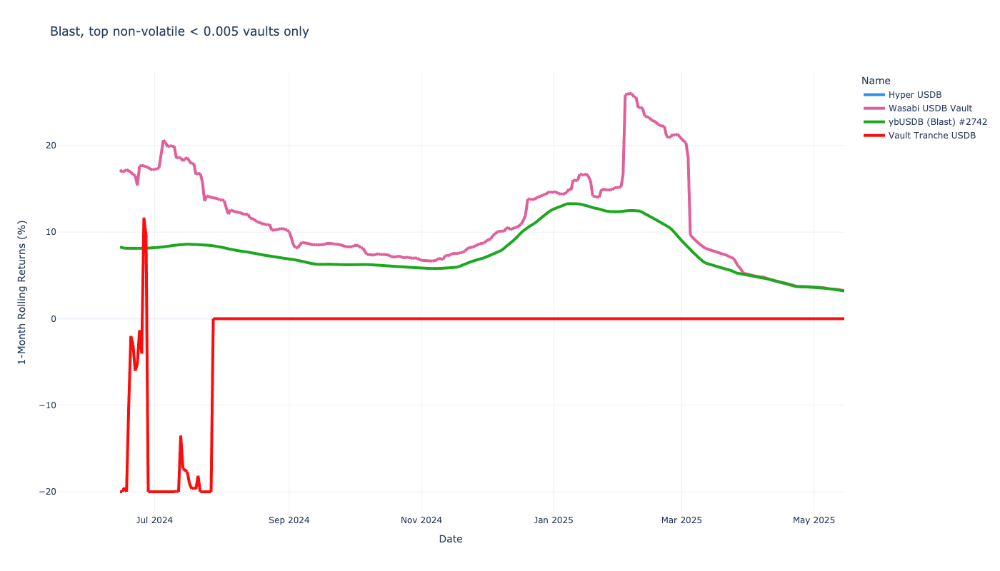

### Sonic

Sonic: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC.e - 24,20.57%,1.86%,20.57%,0.0005,"536,872.33","536,872.33",0.10,unknown,unknown,331.0,Peapods,146-0xd8bfa0e4162d1ec511e36cf7911c02e7956ea0e7,1.86%,2025-04-10,2025-05-16
Peapods Interest Bearing USDC.e - 11,18.22%,2.36%,18.22%,0.0003,"648,118.49","138,165.70",0.14,unknown,unknown,"5,464.0",Peapods,146-0x4c318e6a973f78e3aa36e8661a9770c427eacf97,2.36%,2025-03-26,2025-05-16
Peapods Interest Bearing USDC.e - 8,13.94%,2.02%,13.94%,0.0002,"28,295.78","26,542.82",0.15,unknown,unknown,682.0,Peapods,146-0x4f5f42f69f4804b9a88fc5fa94dbabd8903e6d03,2.02%,2025-03-21,2025-05-16
Peapods Interest Bearing USDC.e - 5,13.00%,1.89%,13.00%,0.0001,"148,200.19","85,787.19",0.15,unknown,unknown,"1,402.0",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,1.89%,2025-03-21,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 27",11.79%,3.10%,9.86%,0.0001,"1,998,193.19","1,900,463.81",0.27,unknown,unknown,"3,997.0",<unknown ERC-4626>,146-0x7e88ae5e50474a48dea4c42a634aa7485e7caa62,2.61%,2025-02-17,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 49",9.00%,1.04%,9.00%,0.0001,"1,305,078.29","873,130.50",0.12,unknown,unknown,"2,194.0",<unknown ERC-4626>,146-0xa18a8f100f2c976044f2f84fae1ee9f807ae7893,1.04%,2025-04-02,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 34",6.09%,1.12%,6.09%,0.0001,"2,190,897.13","986,906.54",0.19,unknown,unknown,"2,942.0",<unknown ERC-4626>,146-0x6030ad53d90ec2fb67f3805794dbb3fa5fd6eb64,1.12%,2025-03-08,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 23",7.65%,2.12%,5.61%,0.0001,"11,856,877.64","6,575,863.52",0.28,unknown,unknown,"23,732.0",<unknown ERC-4626>,146-0x5954ce6671d97d24b782920ddcdbb4b1e63ab2de,1.57%,2025-02-17,2025-05-16
Varlamore USDC Growth,5.14%,0.21%,5.14%,0.0001,"5,717,794.25","5,100,044.48",0.04,unknown,unknown,"1,567.0",<unknown ERC-4626>,146-0xf6f87073cf8929c206a77b0694619dc776f89885,0.21%,2025-05-01,2025-05-16


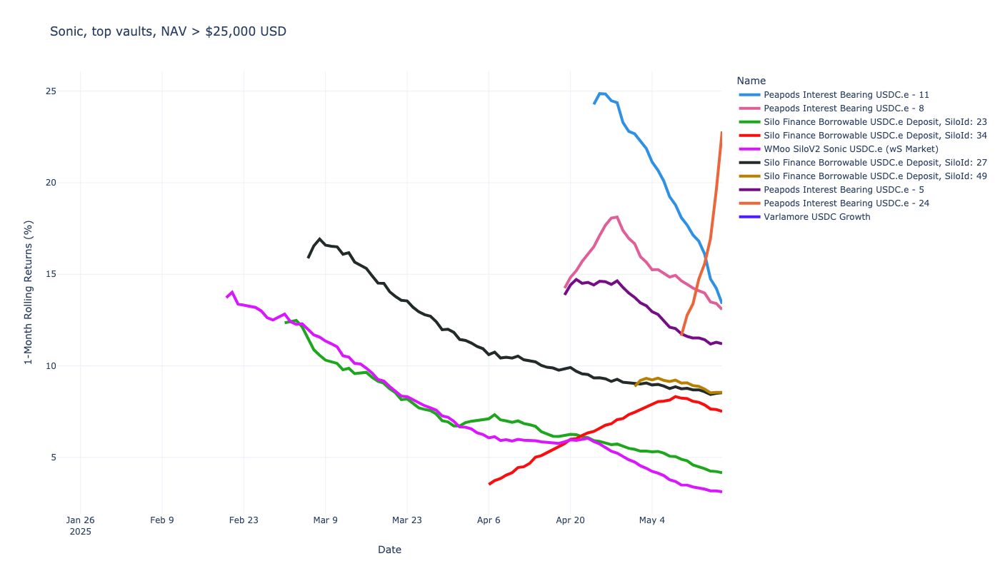

Sonic: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC.e - 24,20.57%,1.86%,20.57%,0.0005,"536,872.33","536,872.33",0.10,unknown,unknown,331.0,Peapods,146-0xd8bfa0e4162d1ec511e36cf7911c02e7956ea0e7,1.86%,2025-04-10,2025-05-16
Peapods Interest Bearing USDC.e - 11,18.22%,2.36%,18.22%,0.0003,"648,118.49","138,165.70",0.14,unknown,unknown,"5,464.0",Peapods,146-0x4c318e6a973f78e3aa36e8661a9770c427eacf97,2.36%,2025-03-26,2025-05-16
Peapods Interest Bearing USDC.e - 8,13.94%,2.02%,13.94%,0.0002,"28,295.78","26,542.82",0.15,unknown,unknown,682.0,Peapods,146-0x4f5f42f69f4804b9a88fc5fa94dbabd8903e6d03,2.02%,2025-03-21,2025-05-16
Peapods Interest Bearing USDC.e - 5,13.00%,1.89%,13.00%,0.0001,"148,200.19","85,787.19",0.15,unknown,unknown,"1,402.0",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,1.89%,2025-03-21,2025-05-16
"Silo Finance Borrowable USDC.e Deposit, SiloId: 27",11.79%,3.10%,9.86%,0.0001,"1,998,193.19","1,900,463.81",0.27,unknown,unknown,"3,997.0",<unknown ERC-4626>,146-0x7e88ae5e50474a48dea4c42a634aa7485e7caa62,2.61%,2025-02-17,2025-05-16


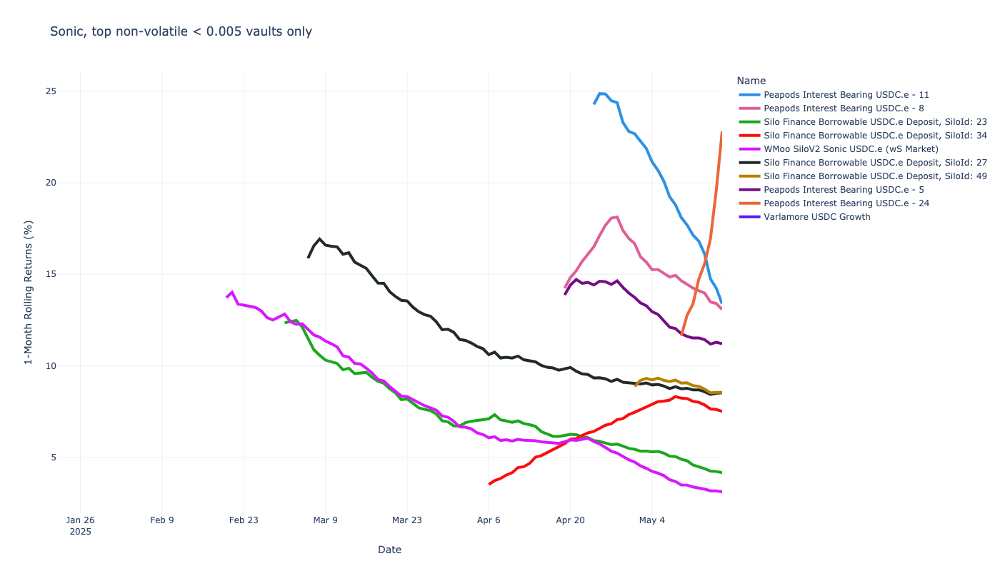

### Berachain

Berachain: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
EVK Vault eUSDC.e-2,6.66%,1.03%,6.66%,0.0002,"5,398,319.00","88,823.39",0.16,unknown,unknown,"1,590.0",Euler Vault Kit,80094-0x66f233ac844c3948a516857ca769872e5941f91c,1.03%,2025-03-19,2025-05-16
EVK Vault eUSDC.e-4,5.18%,0.60%,5.18%,0.0002,"494,765.43","494,765.43",0.12,unknown,unknown,899.0,Euler Vault Kit,80094-0x1b33d24c4c78a61da80cfa2d0db72ca0851d5fb1,0.60%,2025-04-03,2025-05-16
EVK Vault eUSDC.e-1,4.68%,0.73%,4.68%,0.0002,"6,852,074.66","558,758.85",0.16,unknown,unknown,"1,915.0",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,0.73%,2025-03-19,2025-05-16
EVK Vault eUSDC.e-3,3.91%,0.61%,3.91%,0.0001,"5,472,974.66","2,960,111.49",0.16,unknown,unknown,"1,236.0",Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,0.61%,2025-03-19,2025-05-16
HyperBERA.USDC,1.99%,0.53%,1.99%,0.0004,"10,000,000.00","2,525,230.41",0.27,unknown,unknown,743.0,<unknown ERC-4626>,80094-0x36b933554782b108bb9962ac00c498acbceb706d,0.53%,2025-02-17,2025-05-16
Lend USDC on Dahlia sUSDe/USDC (91% LLTV),1.00%,0.27%,0.98%,0.0001,"654,899.40","147,478.60",0.27,unknown,unknown,79.0,<unknown ERC-4626>,80094-0x50e394b94d7d40edff1481506542e5d4931c7a05,0.26%,2025-02-17,2025-05-16
dgnBeraland_boyco,0.00%,0.00%,0.00%,0.0000,"266,800.00","266,800.00",0.26,unknown,unknown,27.0,<unknown ERC-4626>,80094-0x6a4d2462c5f9cf21f05e441911d88d38754a1137,0.00%,2025-02-17,2025-05-16
Concrete-BeraUSDe-Vault,0.00%,0.00%,0.00%,0.0000,"6,252,593.02","6,252,593.02",0.02,unknown,unknown,106.0,<unknown ERC-4626>,80094-0x585934afbf1fa9f563b80283f8b916dd8f66a9b6,0.00%,2025-05-09,2025-05-16
Concrete-USDe-Vault (Berachain) #3260,0.00%,0.00%,0.00%,0.0000,"71,948,602.11","19,112,307.88",0.27,unknown,unknown,"3,683.0",<unknown ERC-4626>,80094-0x59e24f42cae1b82c8b2dc79ea898f2f8b4986dfc,0.00%,2025-02-17,2025-05-16


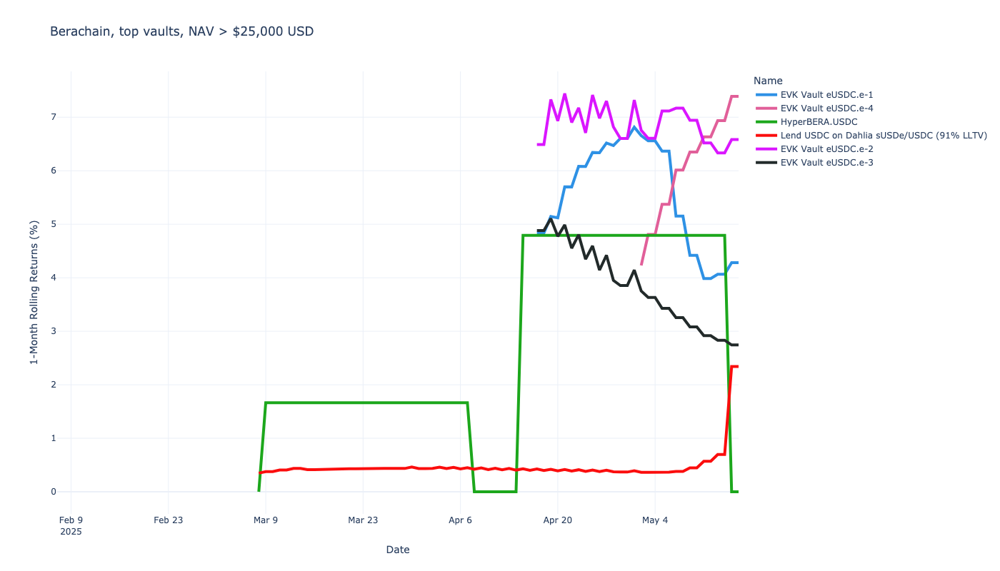

Berachain: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
EVK Vault eUSDC.e-2,6.66%,1.03%,6.66%,0.0002,"5,398,319.00","88,823.39",0.16,unknown,unknown,"1,590.0",Euler Vault Kit,80094-0x66f233ac844c3948a516857ca769872e5941f91c,1.03%,2025-03-19,2025-05-16
EVK Vault eUSDC.e-4,5.18%,0.60%,5.18%,0.0002,"494,765.43","494,765.43",0.12,unknown,unknown,899.0,Euler Vault Kit,80094-0x1b33d24c4c78a61da80cfa2d0db72ca0851d5fb1,0.60%,2025-04-03,2025-05-16
EVK Vault eUSDC.e-1,4.68%,0.73%,4.68%,0.0002,"6,852,074.66","558,758.85",0.16,unknown,unknown,"1,915.0",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,0.73%,2025-03-19,2025-05-16
EVK Vault eUSDC.e-3,3.91%,0.61%,3.91%,0.0001,"5,472,974.66","2,960,111.49",0.16,unknown,unknown,"1,236.0",Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,0.61%,2025-03-19,2025-05-16
HyperBERA.USDC,1.99%,0.53%,1.99%,0.0004,"10,000,000.00","2,525,230.41",0.27,unknown,unknown,743.0,<unknown ERC-4626>,80094-0x36b933554782b108bb9962ac00c498acbceb706d,0.53%,2025-02-17,2025-05-16


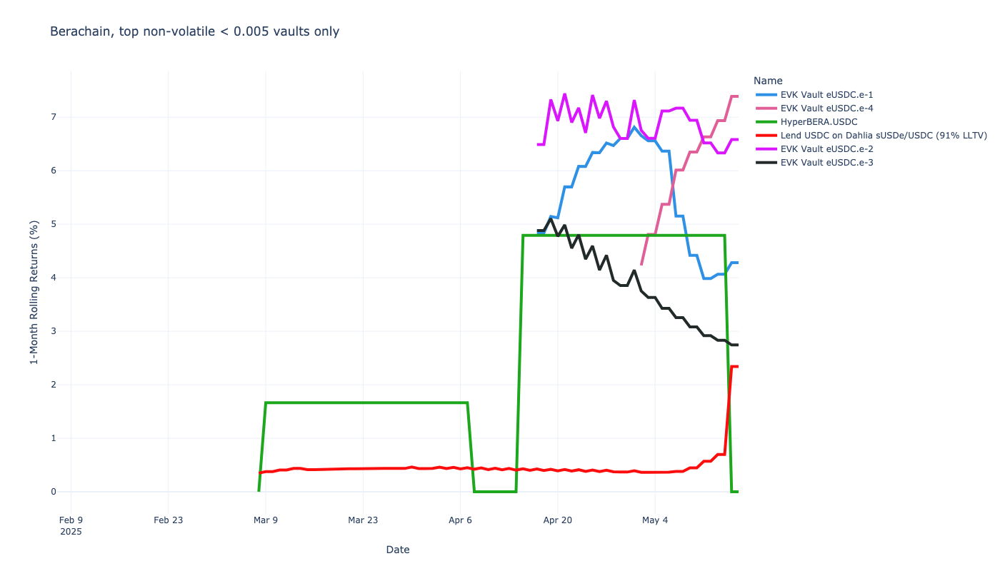

### ZKsync

ZKsync: Displaying top 5 vaults based on three months returns, total 3 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
hsUSDC,12.09%,25.44%,2.45%,0.0039,"3,991,529.01","700,702.64",1.98,unknown,unknown,"48,749.0",<unknown ERC-4626>,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,4.93%,2025-02-17,2025-05-15
Wrapped Mountain Protocol USD (ZKsync) #2794,2.57%,1.36%,1.84%,0.0001,"6,853,574.48","516,058.72",0.53,unknown,unknown,792.0,<unknown ERC-4626>,324-0xa900cbe7739c96d2b153a273953620a701d5442b,0.97%,2025-02-17,2025-05-15
FARM_USDC.e,3.50%,3.12%,1.59%,0.0007,"62,224.41","60,995.57",0.89,unknown,unknown,27.0,Harvest Finance,324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26,1.42%,2025-02-17,2025-05-15


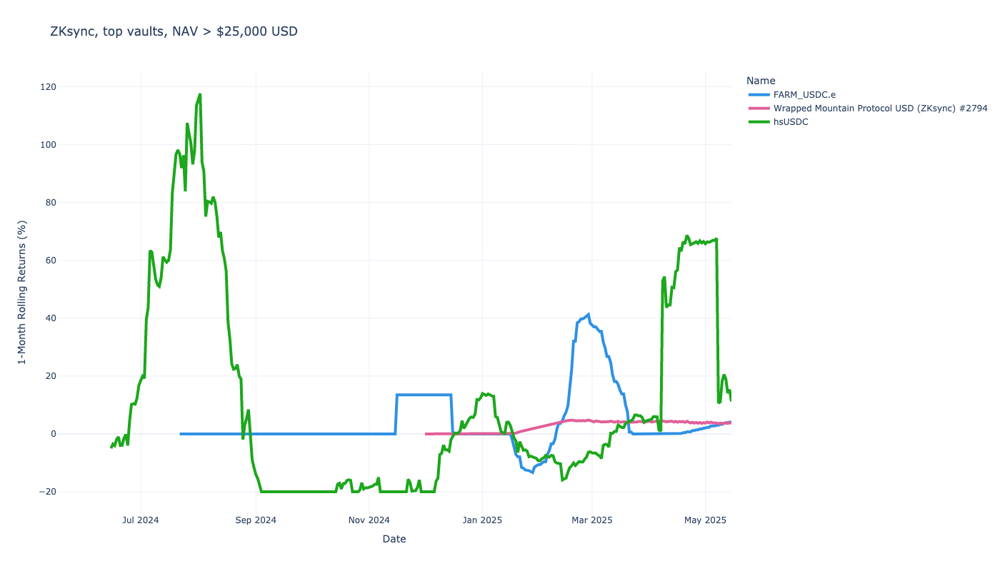

ZKsync: Displaying top 5 non-volatile vaults based on three months returns, total 3 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
hsUSDC,12.09%,25.44%,2.45%,0.0039,"3,991,529.01","700,702.64",1.98,unknown,unknown,"48,749.0",<unknown ERC-4626>,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,4.93%,2025-02-17,2025-05-15
Wrapped Mountain Protocol USD (ZKsync) #2794,2.57%,1.36%,1.84%,0.0001,"6,853,574.48","516,058.72",0.53,unknown,unknown,792.0,<unknown ERC-4626>,324-0xa900cbe7739c96d2b153a273953620a701d5442b,0.97%,2025-02-17,2025-05-15
FARM_USDC.e,3.50%,3.12%,1.59%,0.0007,"62,224.41","60,995.57",0.89,unknown,unknown,27.0,Harvest Finance,324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26,1.42%,2025-02-17,2025-05-15


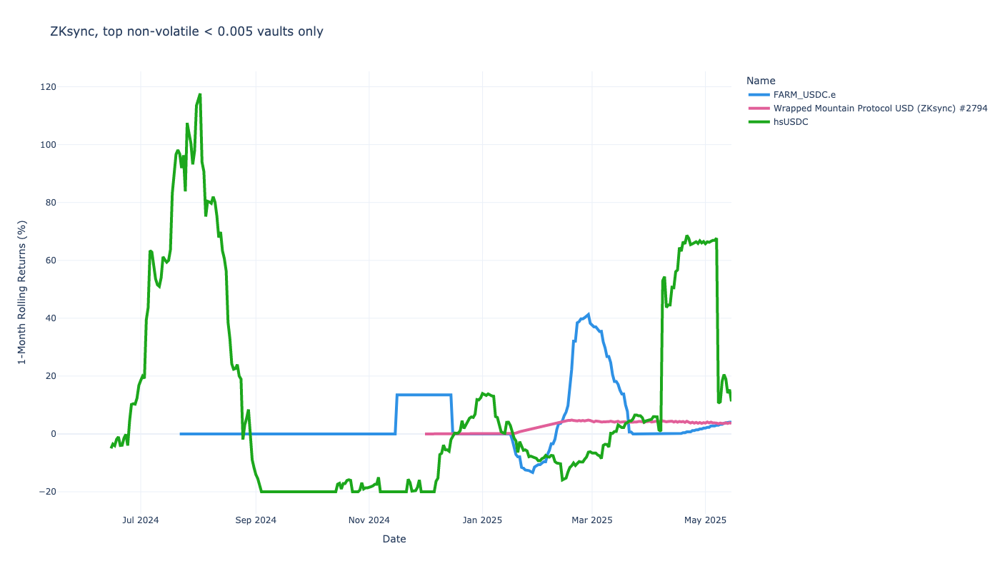

### Avalanche

Avalanche: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
EVK Vault eAUSD-2,7.11%,0.68%,7.11%,0.0001,"64,184,850.64","64,184,850.64",0.10,unknown,unknown,"3,428.0",Euler Vault Kit,43114-0x2137568666f12fc5a026f5430ae7194f1c1362ab,0.68%,2025-04-10,2025-05-16
EVK Vault eUSDt-3,6.78%,0.65%,6.78%,0.0001,"31,798,776.89","31,798,776.89",0.10,unknown,unknown,"2,174.0",Euler Vault Kit,43114-0xa446938b0204aa4055cdfed68ddf0e0d1bab3e9e,0.65%,2025-04-10,2025-05-16
EVK Vault edeUSD-1,6.74%,0.11%,6.74%,0.0001,"10,001,634.42","10,000,418.51",0.02,unknown,unknown,334.0,Euler Vault Kit,43114-0xa45189636c04388adbb4d865100dd155e55682ec,0.11%,2025-05-10,2025-05-16
EVK Vault eUSDC-2 (Avalanche) #2715,5.75%,0.68%,5.75%,0.0001,"81,232,175.55","81,232,175.55",0.12,unknown,unknown,"5,081.0",Euler Vault Kit,43114-0x39de0f00189306062d79edec6dca5bb6bfd108f9,0.68%,2025-04-02,2025-05-16
Staked avUSD,8.40%,4.06%,5.35%,0.0003,"54,093,760.83","54,093,760.83",0.49,unknown,unknown,"1,389.0",<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,2.60%,2025-02-17,2025-05-16
Staked deUSD (Avalanche) #2644,4.14%,1.31%,3.38%,0.0004,"12,052,450.46","12,031,490.22",0.32,unknown,unknown,661.0,<unknown ERC-4626>,43114-0x68088c91446c7bea49ea7dbd3b96ce62b272dc96,1.07%,2025-02-17,2025-05-16
Wrapped Aave Avalanche USDT,2.12%,0.20%,2.12%,0.0000,"3,451,036.69","3,029,281.34",0.10,unknown,unknown,"2,708.0",<unknown ERC-4626>,43114-0x59933c571d200dc6a7fd1cda22495db442082e34,0.20%,2025-04-11,2025-05-16
Wrapped Aave Avalanche USDC,2.03%,0.19%,2.03%,0.0000,"3,835,808.69","3,835,808.69",0.10,unknown,unknown,"29,731.0",<unknown ERC-4626>,43114-0xe1bfc96d95badcb10ff013cb0c9c6c737ca07009,0.19%,2025-04-11,2025-05-16
Wrapped Aave Avalanche AUSD,1.99%,0.19%,1.99%,0.0000,"3,480,848.06","3,448,119.59",0.10,unknown,unknown,"1,687.0",<unknown ERC-4626>,43114-0x45cf39eeb437fa95bb9b52c0105254a6bd25d01e,0.19%,2025-04-11,2025-05-16


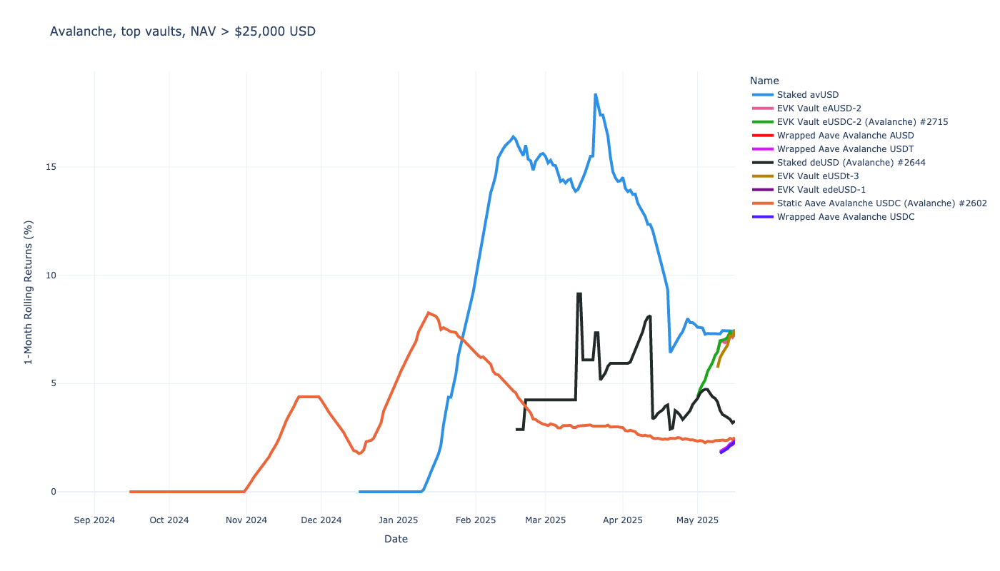

Avalanche: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
EVK Vault eAUSD-2,7.11%,0.68%,7.11%,0.0001,"64,184,850.64","64,184,850.64",0.10,unknown,unknown,"3,428.0",Euler Vault Kit,43114-0x2137568666f12fc5a026f5430ae7194f1c1362ab,0.68%,2025-04-10,2025-05-16
EVK Vault eUSDt-3,6.78%,0.65%,6.78%,0.0001,"31,798,776.89","31,798,776.89",0.10,unknown,unknown,"2,174.0",Euler Vault Kit,43114-0xa446938b0204aa4055cdfed68ddf0e0d1bab3e9e,0.65%,2025-04-10,2025-05-16
EVK Vault edeUSD-1,6.74%,0.11%,6.74%,0.0001,"10,001,634.42","10,000,418.51",0.02,unknown,unknown,334.0,Euler Vault Kit,43114-0xa45189636c04388adbb4d865100dd155e55682ec,0.11%,2025-05-10,2025-05-16
EVK Vault eUSDC-2 (Avalanche) #2715,5.75%,0.68%,5.75%,0.0001,"81,232,175.55","81,232,175.55",0.12,unknown,unknown,"5,081.0",Euler Vault Kit,43114-0x39de0f00189306062d79edec6dca5bb6bfd108f9,0.68%,2025-04-02,2025-05-16
Staked avUSD,8.40%,4.06%,5.35%,0.0003,"54,093,760.83","54,093,760.83",0.49,unknown,unknown,"1,389.0",<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,2.60%,2025-02-17,2025-05-16


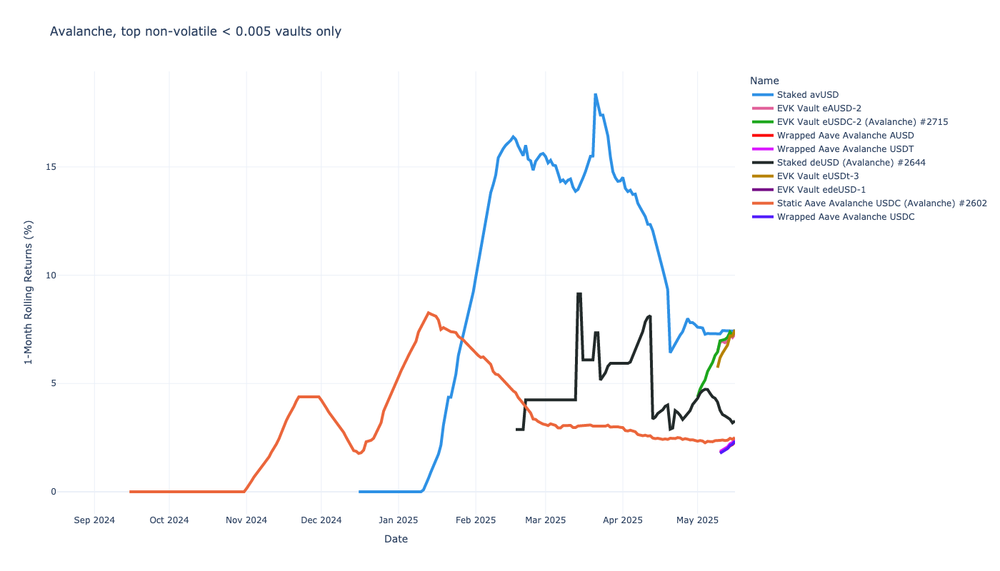

### Gnosis

Gnosis: Displaying top 5 vaults based on three months returns, total 5 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Gnosis) #2788,10.13%,5.26%,5.26%,0.0001,"297,345.83","77,604.55",0.53,unknown,unknown,155.0,<unknown ERC-4626>,100-0xea50f402653c41cadbafd1f788341db7b7f37816,2.76%,2025-02-17,2025-05-16
Savings xDAI,9.60%,16.11%,0.97%,0.0001,"87,049,009.16","84,694,573.52",1.63,unknown,unknown,"645,963.0",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,1.58%,2025-02-17,2025-05-16
Static Aave Gnosis USDCe,2.37%,1.64%,0.85%,0.0000,"591,994.90","202,367.78",0.69,unknown,unknown,"2,471.0",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,0.59%,2025-02-17,2025-05-16
Staked EURA (Gnosis) #2766,4.44%,7.66%,0.48%,0.0000,"720,595.16","550,581.31",1.70,unknown,unknown,"3,639.0",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,0.82%,2025-02-17,2025-05-16
Prize WXDAI - DAI Savings Rate,-0.00%,-0.00%,-0.01%,0.0000,"1,541,649.15","1,417,926.78",0.65,unknown,unknown,"1,857.0",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,-0.01%,2025-02-17,2025-05-16


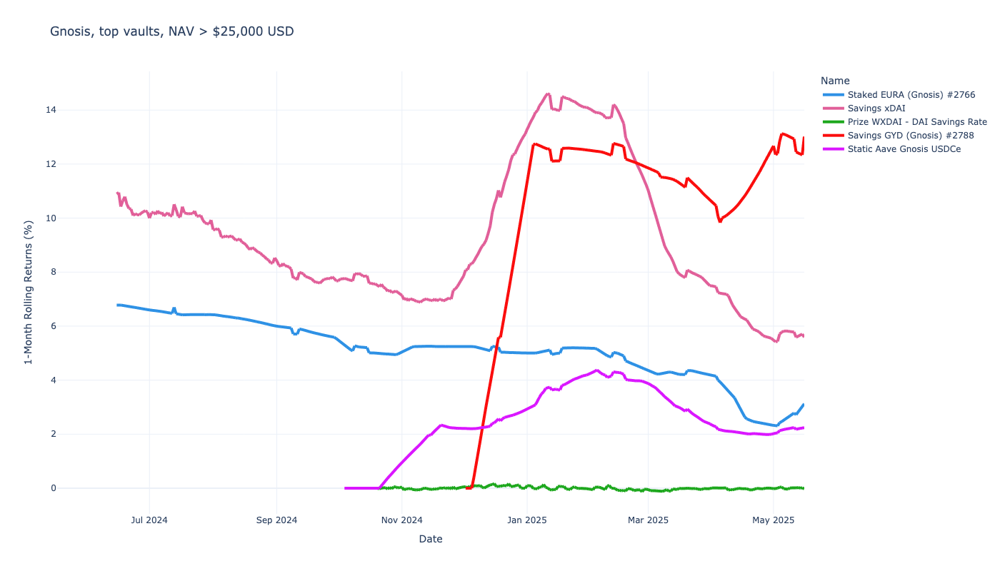

Gnosis: Displaying top 5 non-volatile vaults based on three months returns, total 5 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Gnosis) #2788,10.13%,5.26%,5.26%,0.0001,"297,345.83","77,604.55",0.53,unknown,unknown,155.0,<unknown ERC-4626>,100-0xea50f402653c41cadbafd1f788341db7b7f37816,2.76%,2025-02-17,2025-05-16
Savings xDAI,9.60%,16.11%,0.97%,0.0001,"87,049,009.16","84,694,573.52",1.63,unknown,unknown,"645,963.0",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,1.58%,2025-02-17,2025-05-16
Static Aave Gnosis USDCe,2.37%,1.64%,0.85%,0.0000,"591,994.90","202,367.78",0.69,unknown,unknown,"2,471.0",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,0.59%,2025-02-17,2025-05-16
Staked EURA (Gnosis) #2766,4.44%,7.66%,0.48%,0.0000,"720,595.16","550,581.31",1.70,unknown,unknown,"3,639.0",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,0.82%,2025-02-17,2025-05-16
Prize WXDAI - DAI Savings Rate,-0.00%,-0.00%,-0.01%,0.0000,"1,541,649.15","1,417,926.78",0.65,unknown,unknown,"1,857.0",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,-0.01%,2025-02-17,2025-05-16


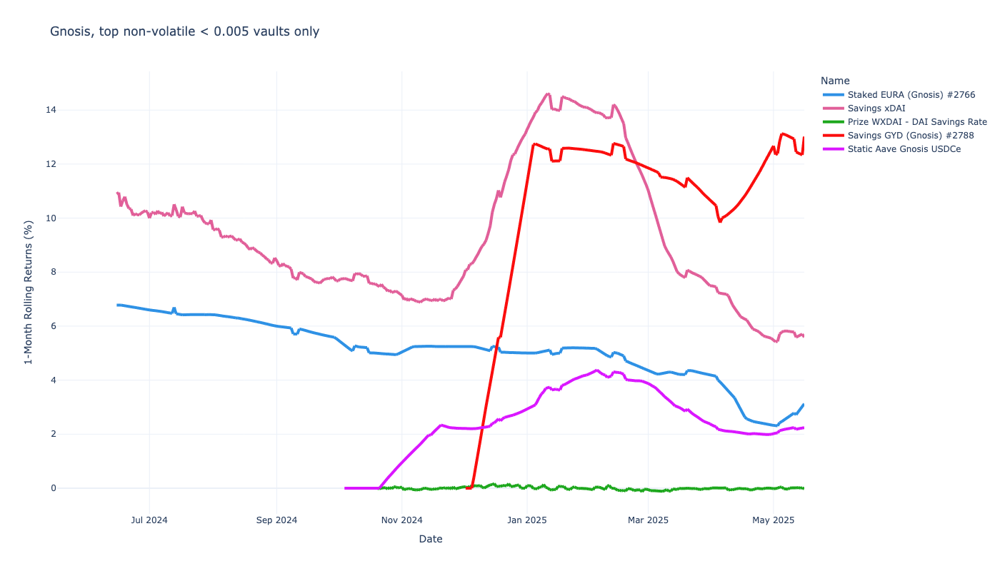

### Celo

Celo: Displaying top 5 vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked EURA (Celo) #2818,3.81%,6.58%,0.51%,0.0000,"3,198,239.37","3,198,239.37",1.70,unknown,unknown,225.0,<unknown ERC-4626>,42220-0x004626a008b1acdc4c74ab51644093b155e59a23,0.87%,2025-02-17,2025-05-16


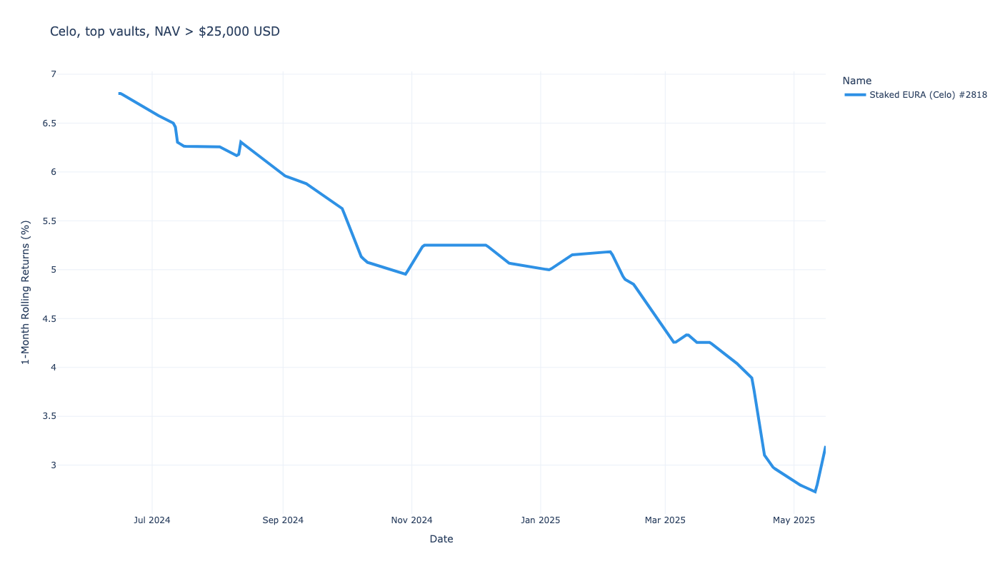

Celo: Displaying top 5 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked EURA (Celo) #2818,3.81%,6.58%,0.51%,0.0000,"3,198,239.37","3,198,239.37",1.70,unknown,unknown,225.0,<unknown ERC-4626>,42220-0x004626a008b1acdc4c74ab51644093b155e59a23,0.87%,2025-02-17,2025-05-16


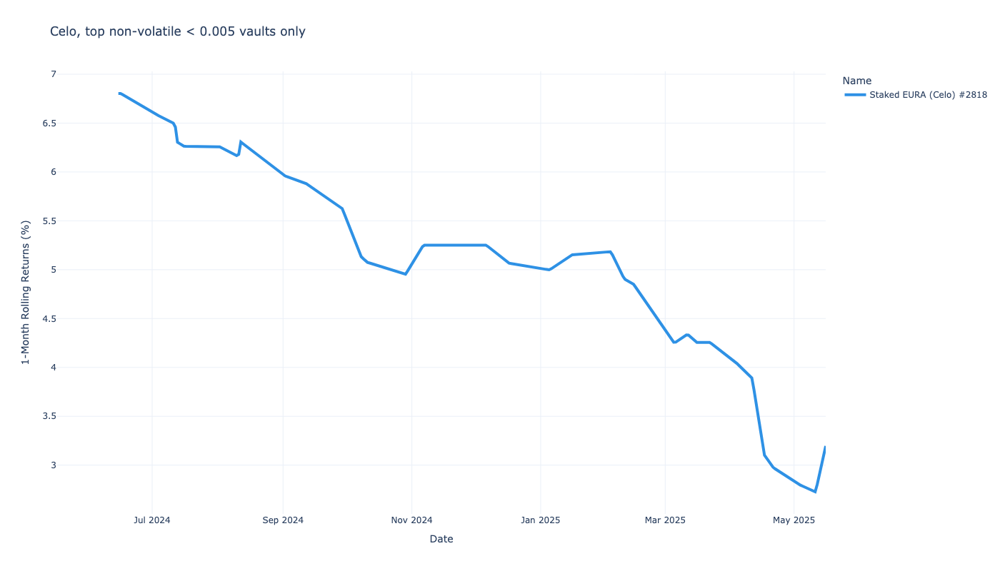

### Mantle

Mantle: Displaying top 5 vaults based on three months returns, total 0 interesting vaults on this chain
No vaults to display: Mantle, top vaults, NAV > $25,000 USD
Mantle: Displaying top 5 non-volatile vaults based on three months returns, total 0 interesting vaults on this chain
No vaults to display: Mantle, top non-volatile < 0.005 vaults only


### Mode

Mode: Displaying top 5 vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.0000,"599,423.34","337,647.27",0.74,unknown,unknown,183.0,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,0.00%,2025-02-17,2025-05-15
USDT Ironclad Vault (Mode) #1962,0.00%,0.00%,0.00%,0.0000,"148,025.55","111,020.54",0.74,unknown,unknown,31.0,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,0.00%,2025-02-17,2025-05-15


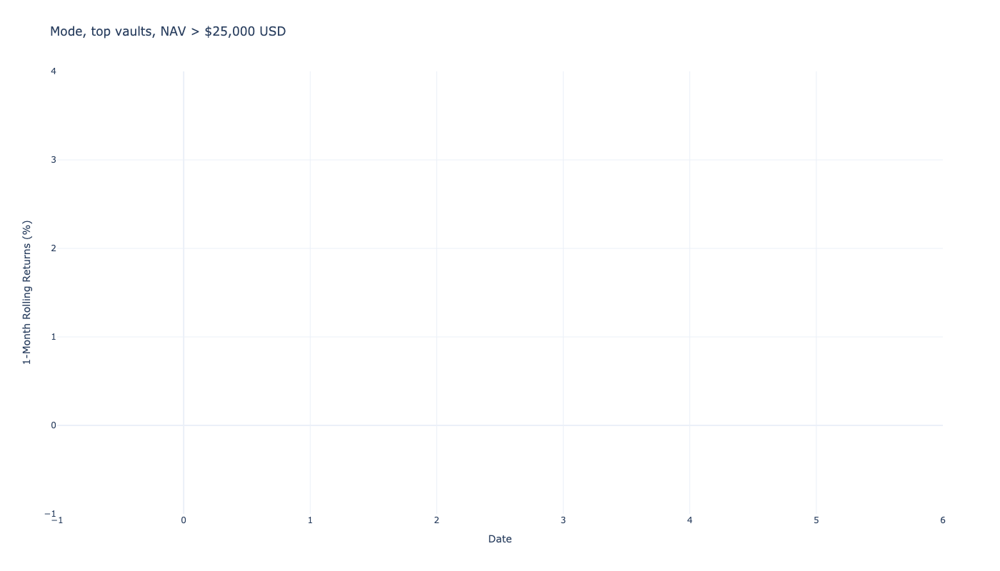

Mode: Displaying top 5 non-volatile vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.0000,"599,423.34","337,647.27",0.74,unknown,unknown,183.0,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,0.00%,2025-02-17,2025-05-15
USDT Ironclad Vault (Mode) #1962,0.00%,0.00%,0.00%,0.0000,"148,025.55","111,020.54",0.74,unknown,unknown,31.0,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,0.00%,2025-02-17,2025-05-15


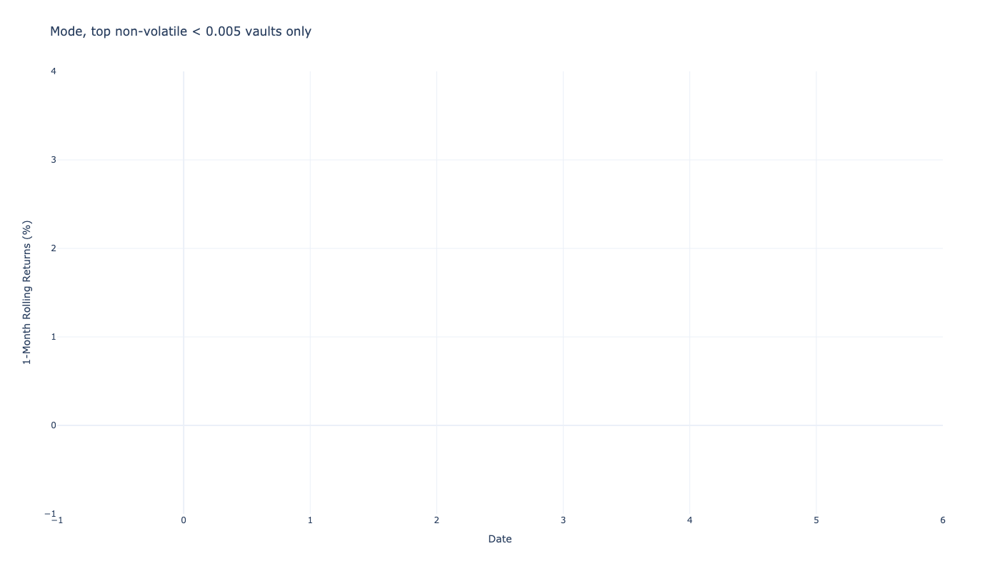

### Soneium

Soneium: Displaying top 5 vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
UB-USDC,0.12%,0.04%,0.12%,0.0000,"1,466,682.67","1,153,717.60",0.34,unknown,unknown,"248,668.0",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,0.04%,2025-02-17,2025-05-16


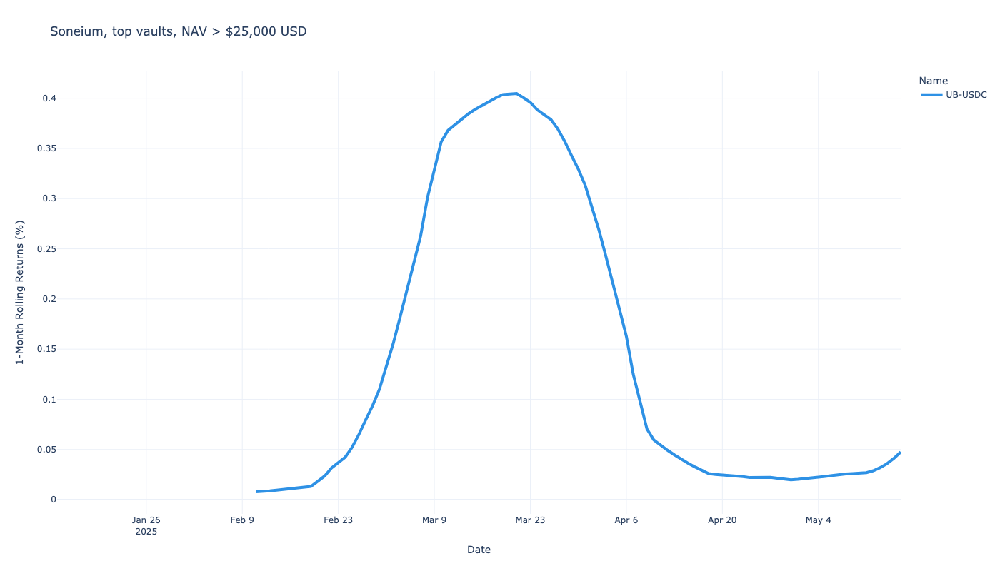

Soneium: Displaying top 5 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
UB-USDC,0.12%,0.04%,0.12%,0.0000,"1,466,682.67","1,153,717.60",0.34,unknown,unknown,"248,668.0",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,0.04%,2025-02-17,2025-05-16


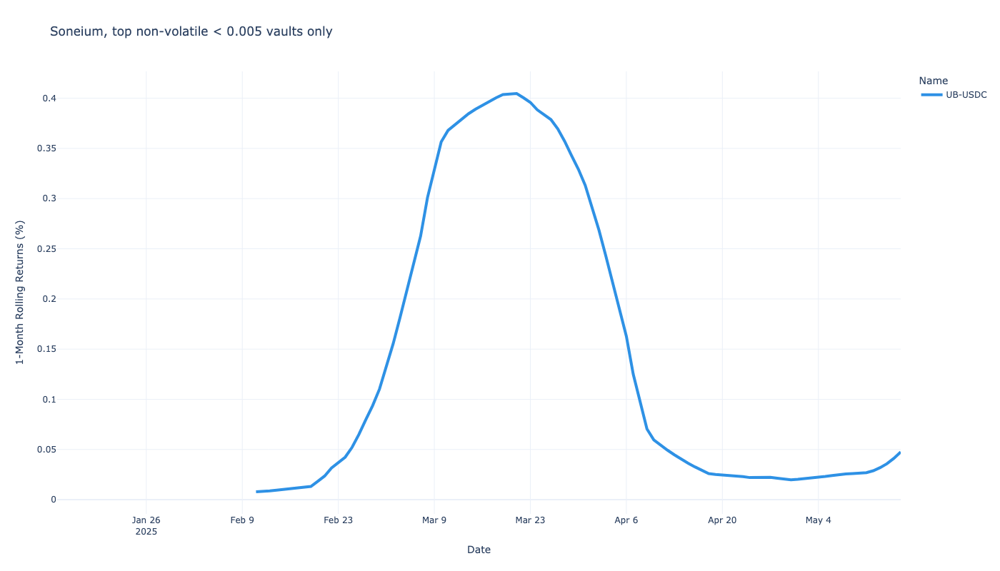

### Hyperliquid

Hyperliquid: Displaying top 5 vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
hyUSDXL (Purr) - 2,0.00%,0.00%,0.00%,0.0000,"142,122.19","142,122.19",0.05,unknown,unknown,235.0,<unknown ERC-4626>,999-0x8001e1e7b05990d22dd8cdb9737f9fe6589827ce,0.00%,2025-04-19,2025-05-08
hyUSDXL (Looped HYPE) - 1,0.00%,0.00%,0.00%,0.0000,"2,072,738.89","2,072,738.89",0.05,unknown,unknown,945.0,<unknown ERC-4626>,999-0xaeedd5b6d42e0f077ccf3e7a78ff70b8cb217329,0.00%,2025-04-19,2025-05-08


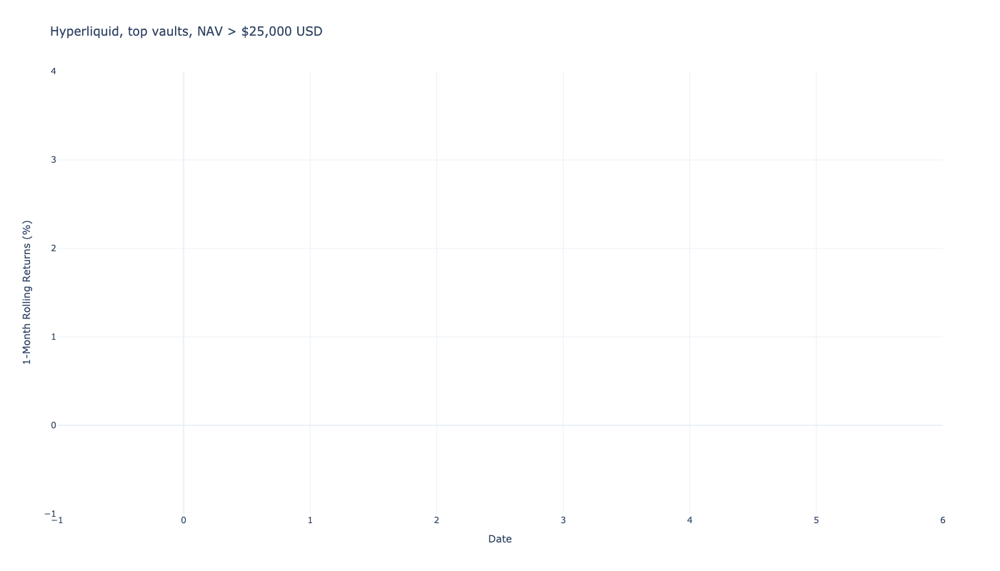

Hyperliquid: Displaying top 5 non-volatile vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,Last 3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
hyUSDXL (Purr) - 2,0.00%,0.00%,0.00%,0.0000,"142,122.19","142,122.19",0.05,unknown,unknown,235.0,<unknown ERC-4626>,999-0x8001e1e7b05990d22dd8cdb9737f9fe6589827ce,0.00%,2025-04-19,2025-05-08
hyUSDXL (Looped HYPE) - 1,0.00%,0.00%,0.00%,0.0000,"2,072,738.89","2,072,738.89",0.05,unknown,unknown,945.0,<unknown ERC-4626>,999-0xaeedd5b6d42e0f077ccf3e7a78ff70b8cb217329,0.00%,2025-04-19,2025-05-08


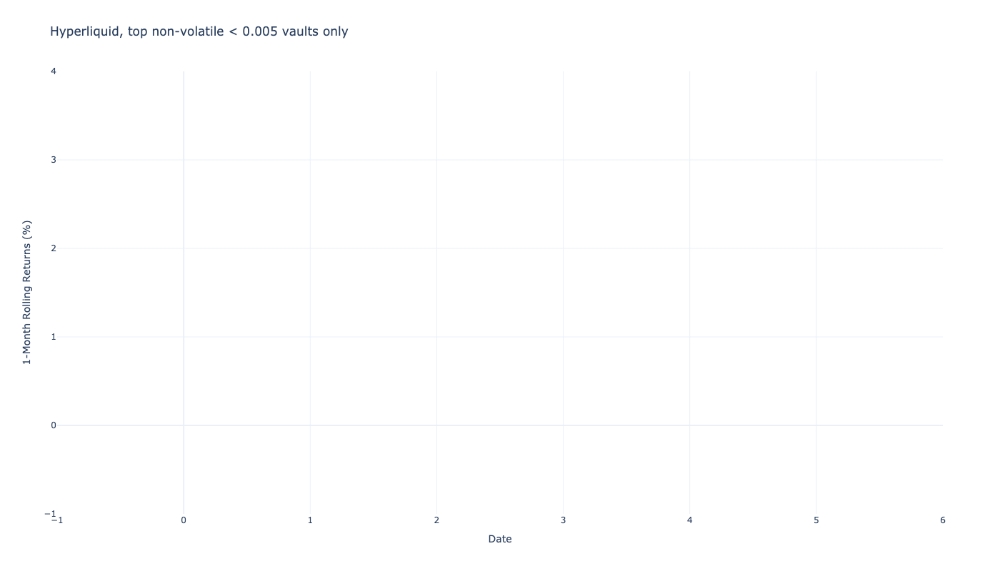

In [80]:
from IPython.display import Markdown

benchmark_count = 10
min_nav = 25_000
volatility_threshold = 0.005

def _draw_chain_top_vaults_chart(interesting_vaults: pd.Series, title: str):
    """Draw 1 months return chart for specific vaults"""
    df = calculate_rolling_returns(
        returns_df, 
        interesting_vaults=interesting_vaults, 
        clip_up=1000,
        clip_down=-20,
        )

    # Remove entries with all zero returns.
    # TODO: Get rid of Hyped USDB and others with zero returns still showing up in the charts
    mask = df.groupby('name')['daily_returns'].transform(lambda x: (x != 0).any())
    filtered_returns_df = df[mask]
    
    if len(df) == 0:
        print(f"No vaults to display: {title}")
        return

    # 
    
    fig = px.line(filtered_returns_df, 
                  x='timestamp', 
                  y='rolling_1m_returns_annualized',
                  color='name',
                  title=title, 
                  labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                         'timestamp': 'Date',
                         'name': 'Name'},
                  hover_data=['id'],
                  color_discrete_sequence=qualitative.Dark24,
                  )

    fig.update_layout(
        xaxis_title='Date',
        yaxis_title='1-Month Rolling Returns (%)',
        legend_title='Name',
        hovermode='closest',
        template=pio.templates.default,
    )
    fig.update_traces(line=dict(width=4))
    fig.show()    

# Do 2 charts per chain
for chain_name in lifetime_data_df["chain"].unique():

    display(Markdown(f"### {chain_name}"))
    
    # chain_df = df[df["chain"] == chain_id]
    lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['chain'] == chain_name]
    
    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["current_nav"] >= min_nav]
    lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)
 
    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns

    # Rearrange columns
    column_to_shift = "three_months_cagr"
    new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    print(f"{chain_name}: Displaying top 5 vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df.drop(columns=["chain", "denomination"])
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:benchmark_count]))

    _draw_chain_top_vaults_chart(interesting_vaults, title=f'{chain_name}, top vaults, NAV > ${min_nav:,} USD',)
   

    #
    # Non-volatile
    # 

    print(f"{chain_name}: Displaying top 5 non-volatile vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] < 0.005]
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df[lifetime_data_filtered_slice_df["three_months_volatility"] < 0.005]
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:5]))
    
    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns
    df = calculate_rolling_returns(
        returns_df, 
        interesting_vaults=interesting_vaults, 
        clip_up=1000,
        clip_down=-20,
        )

    # Rearrange columns
    column_to_shift = "three_months_cagr"
    new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    _draw_chain_top_vaults_chart(interesting_vaults, title=f'{chain_name}, top non-volatile < {volatility_threshold} vaults only',)


## Analyse a single picked vault

- Get equity curve and portfolio comparison metrics for the top vault that still has NAV left
- We pick Clearstar OpenEden RWA vault for the analysis

### Top vault: Share price chart

- Show the share price of the chosen vault
- We can calculate returns, or APY % from the share price



In [81]:
top_vault_id = "8453-0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657"
name = vaults_by_id[top_vault_id]['Name'] 
vault_df = returns_df.loc[returns_df["id"] == top_vault_id]
daily_returns = returns_df.loc[returns_df["id"] == top_vault_id]["daily_returns"]
vault_metadata = vaults_by_id[top_vault_id]

print(f"Top vault is {name}: {top_vault_id}, having {len(daily_returns):,} daily returns rows")

Top vault is Clearstar OpenEden USDC: 8453-0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657, having 66 daily returns rows


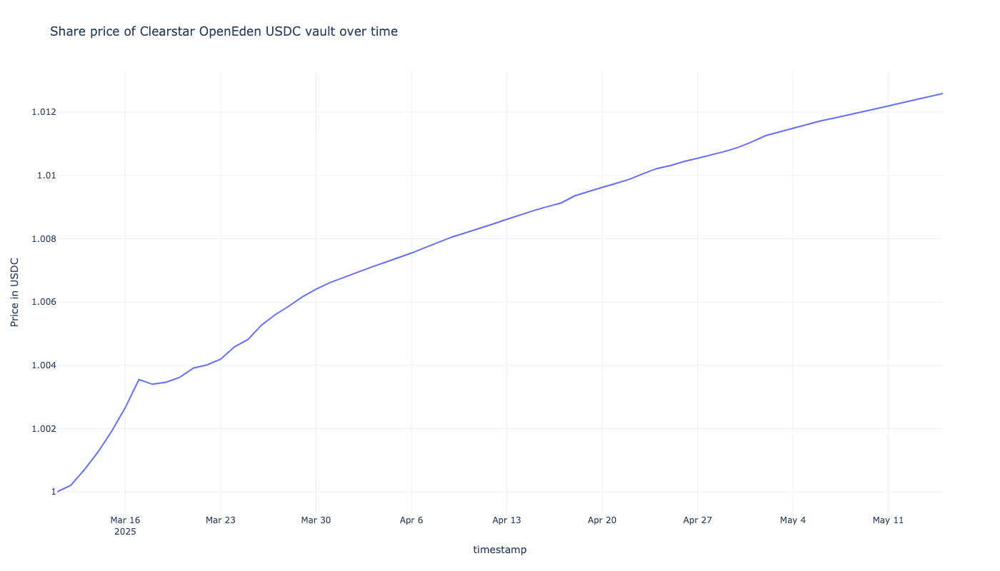

In [82]:
import plotly.express as px
price_series = vault_df["share_price"]

fig = px.line( 
    price_series, 
    title=f"Share price of {name} vault over time"
)
fig.update_layout(yaxis_title=f"Price in {vault_metadata['Denomination']}")
fig.update_layout(showlegend=False)
fig.show()

### Top vault: Net asset value

- What is the value of the all assets locked in the vault
- [Sometimes referred as TVL](https://tradingstrategy.ai/glossary/total-value-locked-tvl)



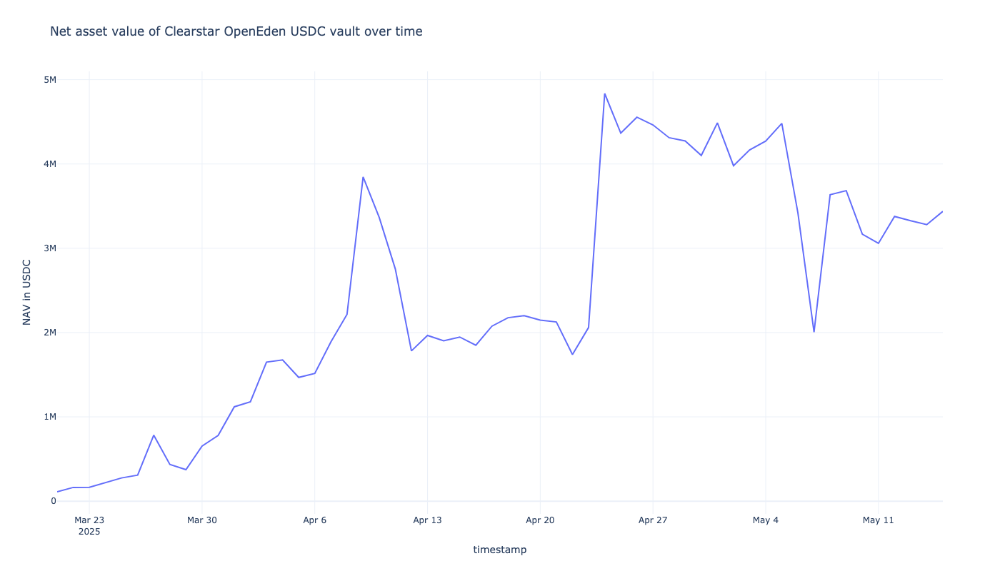

In [83]:
import plotly.express as px
nav_series = vault_df["total_assets"]

# Remove the uninteresting period when NAV is low
min_nav_threshold = 100_000
nav_series = nav_series[nav_series > min_nav_threshold]

fig = px.line( 
    nav_series, 
    title=f"Net asset value of {name} vault over time"
)
fig.update_layout(yaxis_title=f"NAV in {vault_metadata['Denomination']}")
fig.update_layout(showlegend=False)
fig.show()

### Top vault: Performance metrics

- Portfolio performance metrics for this vault

In [84]:
import warnings

with warnings.catch_warnings():  #  DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
    warnings.simplefilter(action='ignore', category=FutureWarning)  # yfinance: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
    try:
        # quantstats compatibility hack for IPython 8.x, ZMQInteractiveShell error
        # https://stackoverflow.com/a/15898875/315168
        get_ipython().magic = lambda x: x
        import quantstats
    except ImportError as e:
        quantstats = None
        

if quantstats:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=RuntimeWarning)
        warnings.simplefilter(action='ignore', category=FutureWarning)
        
        metrics = quantstats.reports.metrics
        performance_metrics_df = metrics(
            daily_returns,
            benchmark=None,
            as_pct=display,  # QuantStats codebase is a mess
            periods_per_year=365,
            mode="full",
            display=False,
            internal=True,
        )    
    print(f"Portfolio performance metrics for {name} vault") 
    performance_metrics_df.rename(columns={"Strategy": name}, inplace=True)
    display(performance_metrics_df)
else:
    print("To show the portfolio performance metrics install quantstats: pip install quantstats")
    
    

Portfolio performance metrics for Clearstar OpenEden USDC vault


,Clearstar OpenEden USDC
Start Period,2025-03-11
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,85.0%
Cumulative Return,0.89%
CAGR﹪,3.51%
Sharpe,28.79
Prob. Sharpe Ratio,100.0%
Smart Sharpe,12.34
Sortino,-


## Analyse other top vaults

- Check some other top vaults for benchmark
- We see from the share price


In [85]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots


def analyse_vault(id: str):

    name = vaults_by_id[id]['Name'] 

    vault_df = returns_df.loc[returns_df["id"] == id]
    daily_returns = returns_df.loc[returns_df["id"] == id]["daily_returns"]
    vault_metadata = vaults_by_id[id]
    print(f"Examining vault {name}: {id}, having {len(daily_returns):,} daily returns rows")    
    nav_series = vault_df["total_assets"]
    
    price_series = vault_df["share_price"]

    # Calculate cumulative returns (what $1 would grow to)
    cumulative_returns = (1 + daily_returns).cumprod()

    # Create figure with secondary y-axis
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    # Add cumulative returns trace on a separate y-axis (share same axis as share price)
    fig.add_trace(
        go.Scatter(
            x=cumulative_returns.index,
            y=cumulative_returns.values,
            name="Cumulative returns (cleaned)",
            line=dict(color='darkgreen', width=4),
            opacity=0.75
        ),
        secondary_y=False,
    )    

    # Add share price trace on primary y-axis
    fig.add_trace(
        go.Scatter(
            x=price_series.index, 
            y=price_series.values, 
            name="Share Price",
            line=dict(color='green', width=4, dash='dash'),
            opacity=0.75  

        ),
        secondary_y=False,
    )

    # Add NAV trace on secondary y-axis
    fig.add_trace(
        go.Scatter(
            x=nav_series.index, 
            y=nav_series.values, 
            name="TVL",
            line=dict(color='blue', width=4),
            opacity=0.75  

        ),
        secondary_y=True,
    )




    # Set titles and labels
    fig.update_layout(
        title_text=f"{name} - Returns TVL and share price",
        hovermode="x unified",
        template=pio.templates.default,
        showlegend=True,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="center",
            x=0.5
        )
    )    

    # Set y-axes titles
    fig.update_yaxes(title_text=f"Share Price ({vault_metadata['Denomination']})", secondary_y=False)
    fig.update_yaxes(title_text=f"TVL ({vault_metadata['Denomination']})", secondary_y=True)

    # Show chart
    fig.show()

    # Show portfolio metrics
    if quantstats:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=RuntimeWarning)
            warnings.simplefilter(action='ignore', category=FutureWarning)
            
            metrics = quantstats.reports.metrics
            performance_metrics_df = metrics(
                daily_returns,
                benchmark=None,
                as_pct=display,  # QuantStats codebase is a mess
                periods_per_year=365,
                mode="simple",
                display=False,
                internal=True,
            )        
            performance_metrics_df.rename(columns={"Strategy": name}, inplace=True)
            display(performance_metrics_df)



    

### Gains USDC on Polygon

- Gains market making vault
- https://gains.trade/vaults/gUSDC

Examining vault Gains Network USDC (Polygon) #2422: 137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81, having 484 daily returns rows


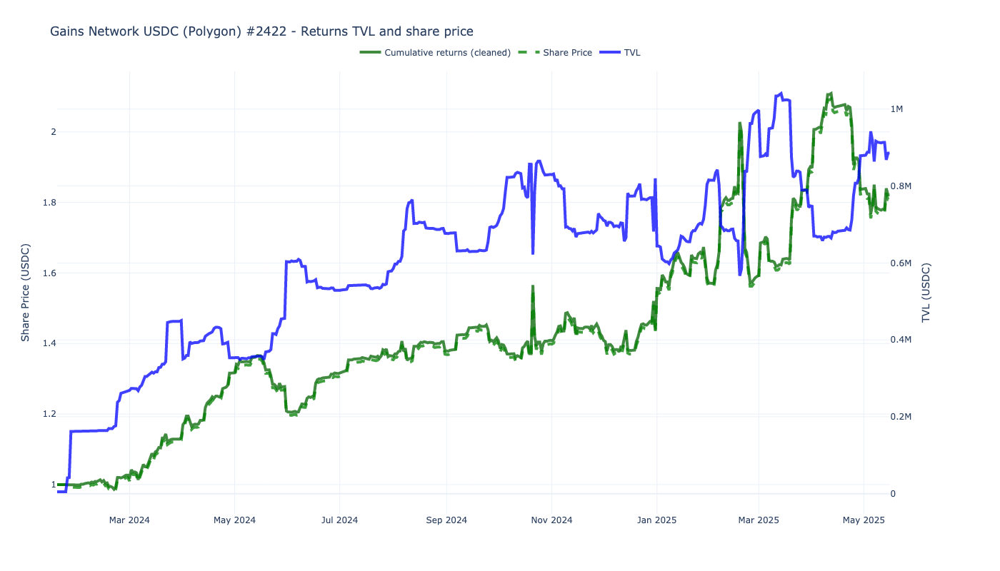

,Gains Network USDC (Polygon) #2422
Start Period,2024-01-19
End Period,2025-05-16
Risk-Free Rate,0.0%
Time in Market,91.0%
Cumulative Return,82.24%
CAGR﹪,36.77%
Sharpe,1.56
Prob. Sharpe Ratio,96.89%
Sortino,2.52
Sortino/√2,1.78


In [86]:
analyse_vault("137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81")

### USDC to yvUSDS Farmer by Yearn

https://yearn.fi/vaults/1/0x602DA189F5aDa033E9aC7096Fc39C7F44a77e942
    ,


Examining vault USDC to yvUSDS Farmer: 1-0x602da189f5ada033e9ac7096fc39c7f44a77e942, having 216 daily returns rows


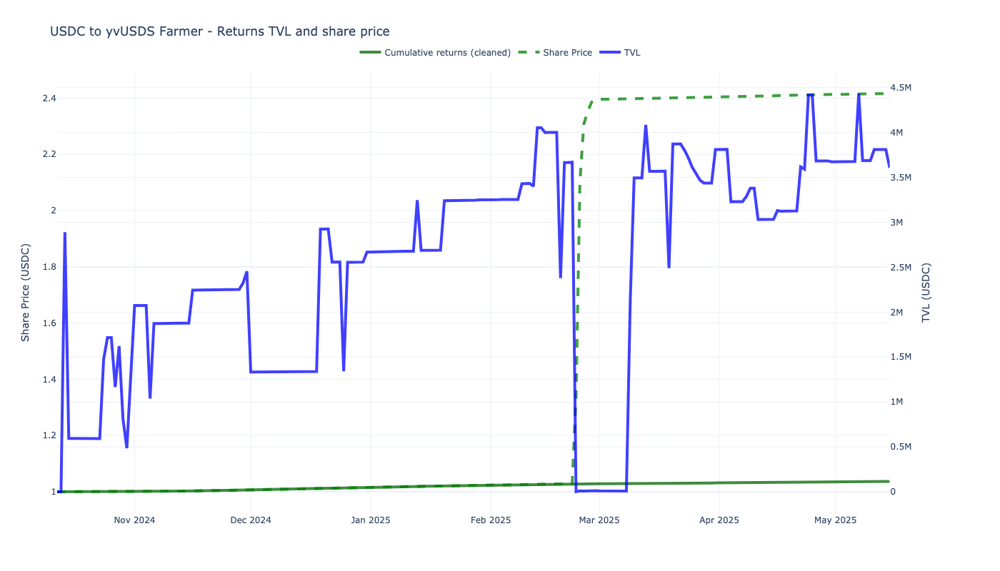

,USDC to yvUSDS Farmer
Start Period,2024-10-12
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,88.0%
Cumulative Return,3.68%
CAGR﹪,4.32%
Sharpe,27.35
Prob. Sharpe Ratio,-
Sortino,-
Sortino/√2,-


In [87]:
analyse_vault("1-0x602da189f5ada033e9ac7096fc39c7f44a77e942")

### Staked avUSD by Avant

https://app.avantprotocol.com/stake



Examining vault Staked avUSD: 43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e, having 181 daily returns rows


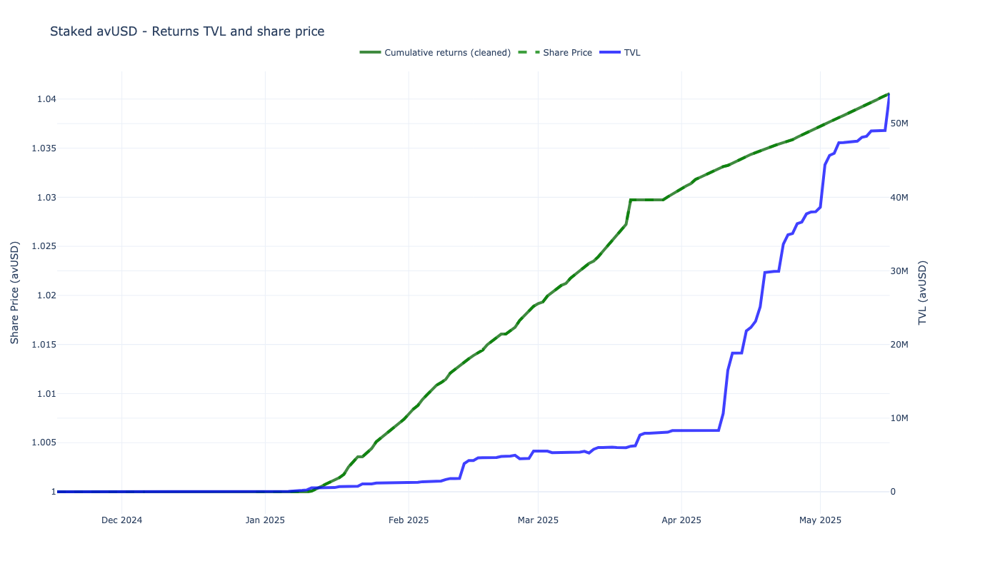

,Staked avUSD
Start Period,2024-11-17
End Period,2025-05-16
Risk-Free Rate,0.0%
Time in Market,65.0%
Cumulative Return,4.06%
CAGR﹪,5.73%
Sharpe,16.64
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


In [88]:
analyse_vault("43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e")

### Morpho Steakhouse USDT Compounder by Yearn

https://yearn.fi/vaults/1/0x0a4ea2bDe8496a878a7ca2772056a8e6fe3245c5,


Examining vault Morpho Steakhouse USDT Compounder: 1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5, having 127 daily returns rows


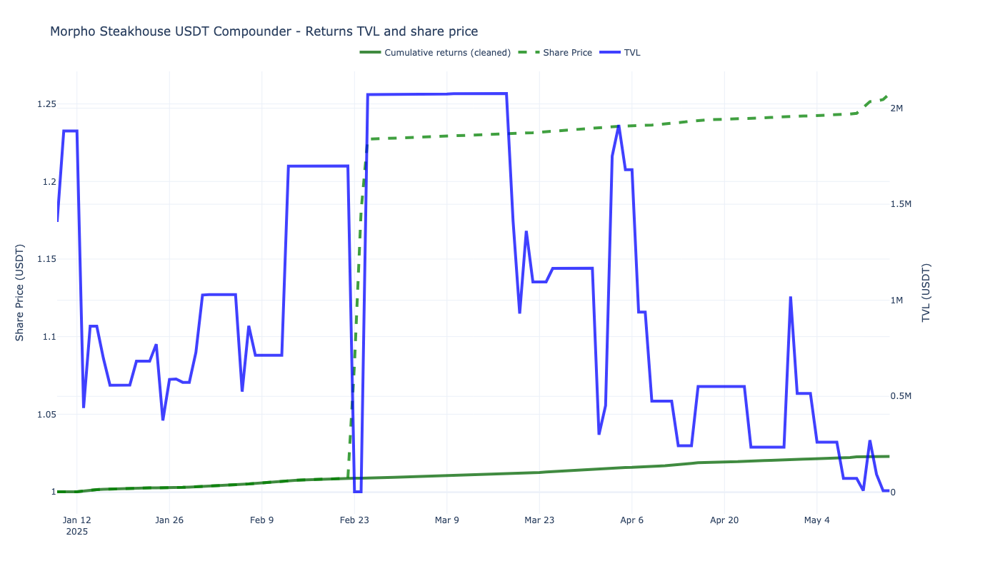

,Morpho Steakhouse USDT Compounder
Start Period,2025-01-09
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,93.0%
Cumulative Return,2.27%
CAGR﹪,4.6%
Sharpe,28.21
Prob. Sharpe Ratio,-
Sortino,-
Sortino/√2,-


,total_assets,daily_returns,dynamic_tvl_threshold,tvl_filtering_mask,chain,address,block_number,share_price,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol,avg_assets_by_vault
timestamp,,,,,,,,,,,,,,,,,
2025-02-10,"713,234.74",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,807,499.00",1.01,"708,879.93",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-11,"713,995.34",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,814,699.00",1.01,"709,363.61",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-12,"713,995.34",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,821,899.00",1.01,"709,095.51",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-13,"1,698,062.92",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,829,099.00",1.01,"1,685,941.23",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-14,"1,698,062.92",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,836,299.00",1.01,"1,685,626.06",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-15,"1,698,062.92",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,843,499.00",1.01,"1,685,310.71",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-16,"1,698,062.92",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,850,699.00",1.01,"1,684,994.84",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-17,"1,698,062.92",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,857,899.00",1.01,"1,684,678.83",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"
2025-02-18,"1,699,216.75",0.00,"20,411.55",False,1,0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,"21,865,099.00",1.01,"1,685,529.54",NaN,NaN,,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,Morpho Steakhouse USDT Compounder,68.00,<unknown ERC-4626>,"1,020,577.38"


In [89]:
vault_id = "1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5"
analyse_vault(vault_id)

vault_returns_df = returns_df.loc[returns_df["id"] == vault_id]

# Identify the columns you want to move to the front
columns_to_move = ['total_assets', 'daily_returns', 'dynamic_tvl_threshold', 'tvl_filtering_mask']
all_columns = vault_returns_df.columns.tolist()
remaining_columns = [col for col in all_columns if col not in columns_to_move]
new_column_order = columns_to_move + remaining_columns
vault_returns_df = vault_returns_df[new_column_order]

display(vault_returns_df.loc[pd.Timestamp("2025-02-10"):pd.Timestamp("2025-02-28")])



### kBOX (Unknown)

- Unknown


Examining vault kBOX: 56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813, having 123 daily returns rows


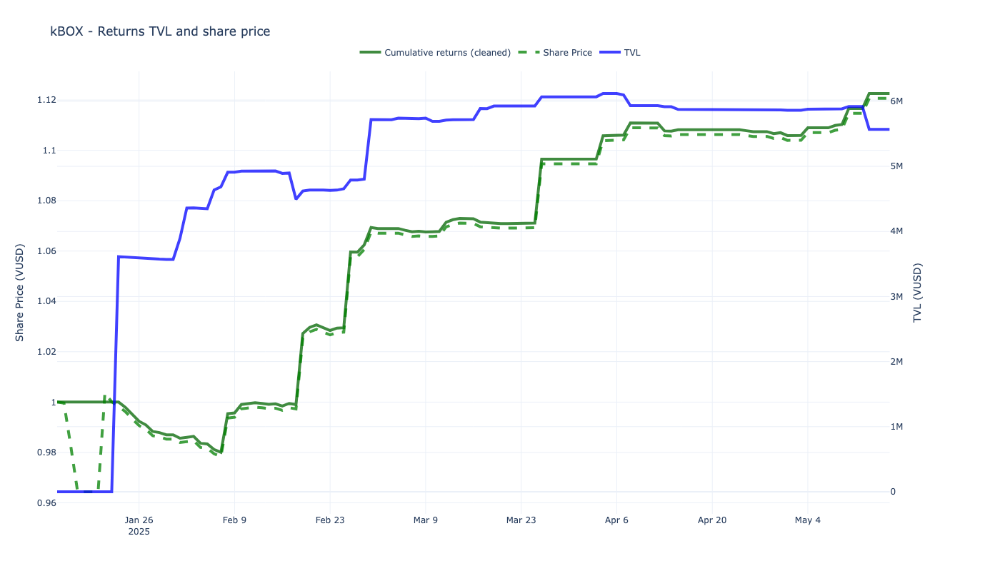

,kBOX
Start Period,2025-01-14
End Period,2025-05-16
Risk-Free Rate,0.0%
Time in Market,69.0%
Cumulative Return,12.26%
CAGR﹪,26.98%
Sharpe,3.9
Prob. Sharpe Ratio,100.0%
Sortino,25.75
Sortino/√2,18.21


In [90]:
analyse_vault("56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813")

### Harvest finance ZKSync

https://app.harvest.finance/zksync/0x1B51eA0e4EDf4fac001D3CD55d3fAFc1D1f02f26#details



Examining vault FARM_USDC.e: 324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26, having 327 daily returns rows


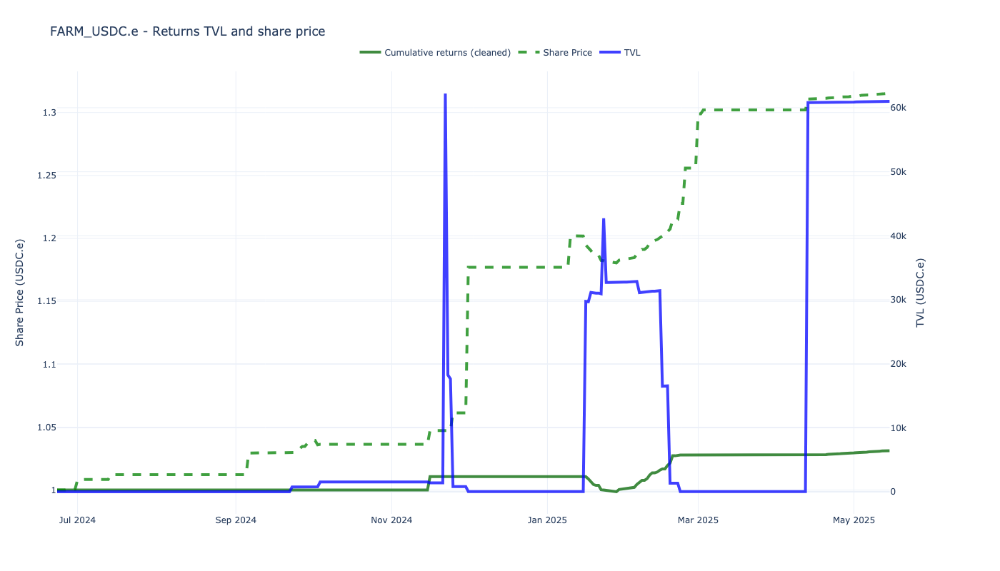

,FARM_USDC.e
Start Period,2024-06-23
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,15.0%
Cumulative Return,3.12%
CAGR﹪,2.4%
Sharpe,2.24
Prob. Sharpe Ratio,99.96%
Sortino,6.45
Sortino/√2,4.56


In [91]:
analyse_vault("324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26")

### 40acres on Optimism

https://www.40acres.finance/

Examining vault 40op-USDC-Vault: 10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957, having 81 daily returns rows


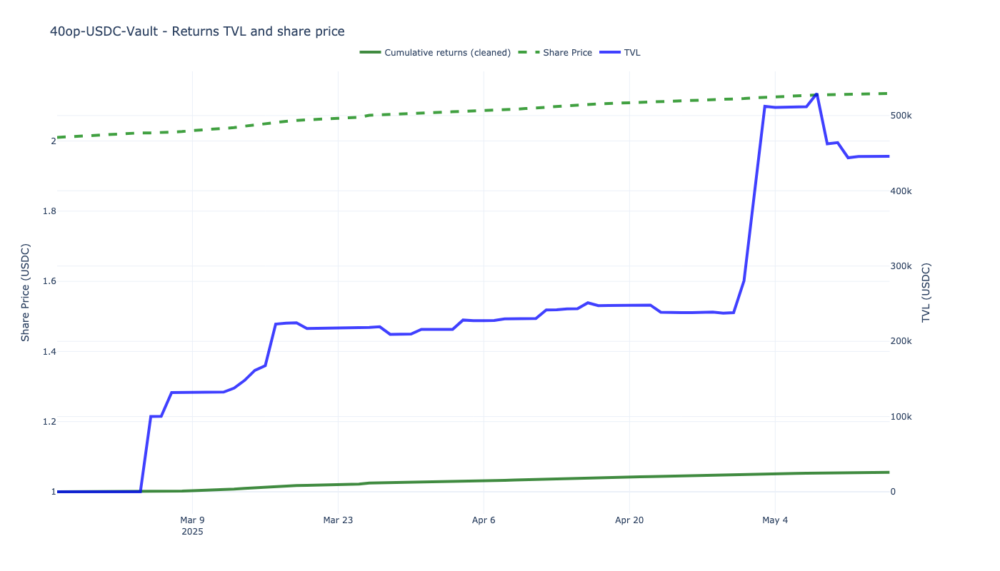

,40op-USDC-Vault
Start Period,2025-02-24
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,88.0%
Cumulative Return,5.55%
CAGR﹪,18.54%
Sharpe,25.74
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


In [92]:
analyse_vault("10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957")

### Ostium market making vault

- On Arbitrum
- https://ostium.app/vault



Examining vault ostiumLP: 42161-0x20d419a8e12c45f88fda7c5760bb6923cee27f98, having 315 daily returns rows


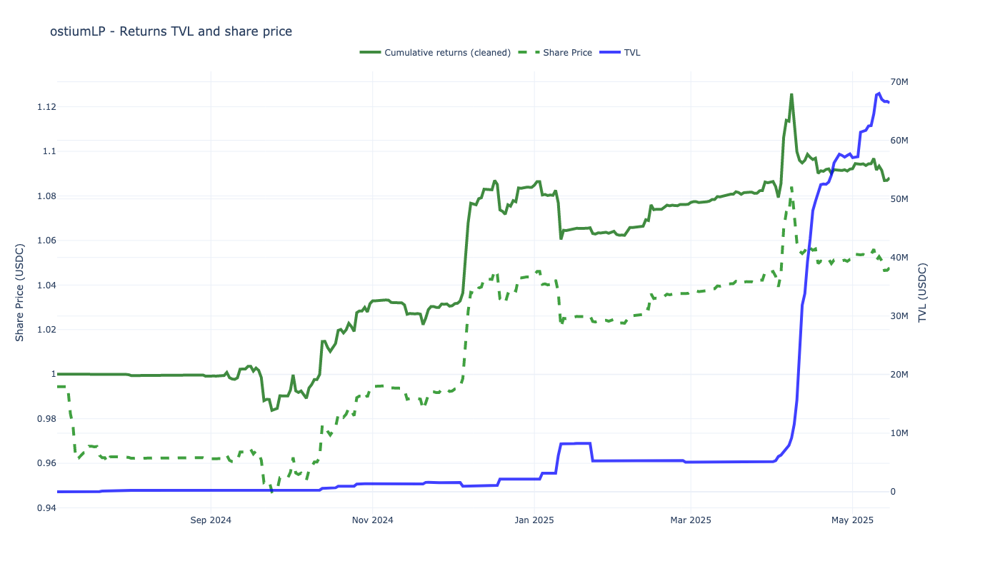

,ostiumLP
Start Period,2024-07-05
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,87.0%
Cumulative Return,8.81%
CAGR﹪,7.01%
Sharpe,1.71
Prob. Sharpe Ratio,94.92%
Sortino,2.79
Sortino/√2,1.97


In [93]:
analyse_vault("42161-0x20d419a8e12c45f88fda7c5760bb6923cee27f98")

### Aave V3 USDS Lender by Yearn 

- https://yearn.fi/vaults/1/0x832c30802054F60f0CeDb5BE1F9A0e3da2a0Cab4


Examining vault Aave V3 USDS Lender: 1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4, having 217 daily returns rows


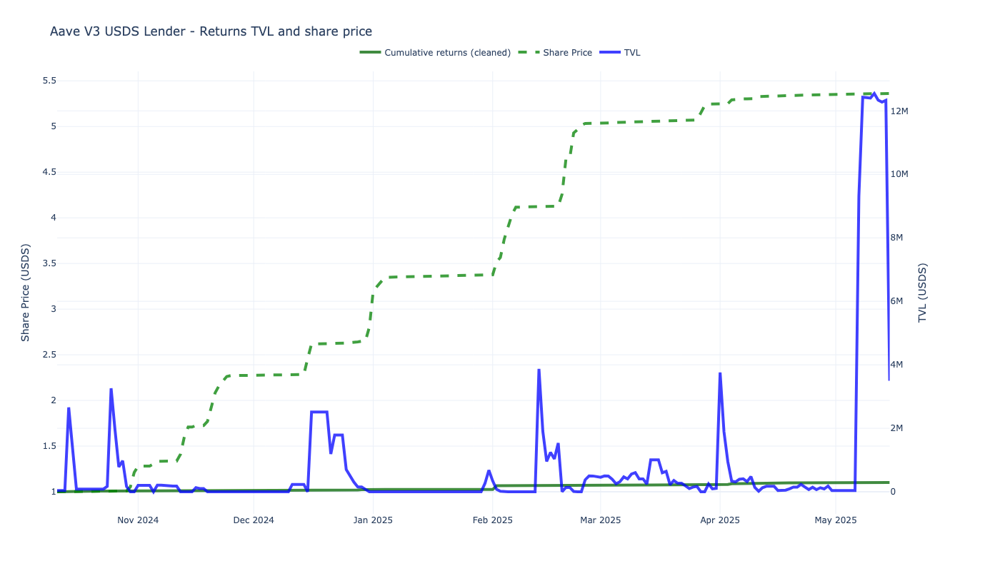

,Aave V3 USDS Lender
Start Period,2024-10-11
End Period,2025-05-15
Risk-Free Rate,0.0%
Time in Market,60.0%
Cumulative Return,10.26%
CAGR﹪,12.07%
Sharpe,3.03
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


In [94]:
analyse_vault("1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4")